In [15]:
from lib.builders import constant_step_search, golden_search, wolfe_search
from lib.visualize import draw_contour_with_trajectory, draw_3d_with_trajectory, draw_3d, draw_contour
from lib.fungen import generate_quadratic
from lib.linesearch import Statistics
from functions import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Latex

In [16]:
INF = 1000000
INF_CHAR = "\u221e"
UNKNOWN_CHAR = "-"
it_cnt = "Количество итераций"
min_x = "Точка минимума"
min_f = "Значение в точке минимума"
f_cnt = "Количество вычислений функции"
grad_cnt = "Количество вычислений градиента"


def converges(f, argmin):
    return np.abs(f(argmin)) < INF

def create_pd_stat():
    pd_stat = pd.DataFrame({
        it_cnt: [],
        min_x: [],
        min_f: [],
        f_cnt: [],
        grad_cnt: []
    })
    return pd_stat

def round(x):
    return np.round(x, 3) + 0

def format_num(x):
    return "{:g}".format(round(x))
    
def add_stat(df, label, f, argmin, stat: Statistics):
    conv = converges(f, argmin)
    def get_if_converges(x, not_conv_value):
        return x if (conv) else not_conv_value
    def round(x):
        return np.round(x, 3) + 0 # + 0 used for better printing
    steps_str = str(int(stat.get(Statistics.STEPS)))
    argmin_str = "({:g}, {:g})".format(round(argmin[0]), round(argmin[1]))
    f_min_str = "{:g}".format(round(f(argmin)))
    f_cnt_str = str(int(stat.get(Statistics.FUNCTION)))
    grad_cnt_str = str(int(stat.get(Statistics.GRADIENT)))
    df.loc[label] = [
        get_if_converges(steps_str, INF_CHAR),
        get_if_converges(argmin_str, UNKNOWN_CHAR),
        get_if_converges(f_min_str, UNKNOWN_CHAR),
        get_if_converges(f_cnt_str, INF_CHAR),
        get_if_converges(grad_cnt_str, INF_CHAR),
    ]
def show_md(text):
    from IPython.display import Markdown, display
    display(Markdown(text))
    
def df_to_markdown(df, index_name=None):
    from IPython.display import Markdown, display
    df.index.name = index_name
    df = df.reset_index() if index_name is not None else df
    fmt = ['---' for _ in range (len (df.columns ))]
    df_fmt = pd.DataFrame ([fmt], columns = df.columns)
    df_formatted = pd.concat ([df_fmt, df])
    display(Markdown(df_formatted.to_csv (sep = "|", index =  False)))

def to_pd_stat(label, f, argmin, stat):
    pd_stat = create_pd_stat()
    add_stat(pd_stat, label, f, argmin, stat)
    return pd_stat

def draw_search(
        search, f, x_0, label,  
        scale=(1, 1), view=(50, 50)
    ):
    fig = plt.figure(figsize=(8, 4), dpi=200)
    ax_3d = fig.add_subplot(1, 2, 1, projection='3d')
    ax_contour = fig.add_subplot(1, 2, 2)

    argmin, stat, history = search.search_min(x_0, f)
    
    pd_stat = create_pd_stat()
    add_stat(pd_stat, label, f, argmin, stat)

    ax_3d.set_title(label)
    ax_3d.view_init(view[0], view[1])
    draw_3d_with_trajectory(ax_3d, history, f, scale)

    ax_contour.set_title(label)
    draw_contour_with_trajectory(ax_contour, history, f, scale)

    fig.tight_layout()
    return pd_stat

def draw_constant_step_search(label ,step, f, x_0, scale=(1, 1), view=(50, 50)):
    return draw_search(
        search=constant_step_search(step),
        f=f,
        x_0=x_0,
        label=label,
        view=view,
        scale=scale
    )

def draw_golden_search(label ,step, f, x_0, scale=(1, 1), view=(50, 50)):
    return draw_search(
        search=golden_search(step),
        f=f,
        x_0=x_0,
        label=label,
        view=view,
        scale=scale
    )

def draw_wolfe_search(label ,c1, c2, f, x_0, scale=(1, 1), view=(50, 50)):
    return draw_search(
        search=wolfe_search(c1, c2),
        f=f,
        x_0=x_0,
        label=label,
        view=view,
        scale=scale
    )

# Постановка задачи 

1. Реализовать градиентный спуск с постоянным шагом.
2. Реализовать метод одномерного поиска (метод дихотомии, метод Фибоначчи,
метод золотого сечения) и градиентный спуск на его основе.
3. Проанализировать траекторию градиентного спуска на примере 
двух-трёх квадратичных функций, на которых работа методов отличается.
4. Для каждой функции:
    * исследовать сходимость градиентного спуска с постоянным шагом, сравнить полученные результаты для выбранных функций
    * сравнить эффективность градиентного спуска с использованием одномерного поиска с точки зрения количества вычислений минимизируемой функции и ее градиентов
    * исследовать работу методов в зависимости от выбора начальной точки
    * исследовать влияние нормализации (scaling) на сходимость на примере масштабирования осей плохо обусловленной функции
    * в каждом случае нарисовать графики с линиями уровня и траекториями методов
5. Реализовать генератор случайных квадратичных функций n переменных с числом обусловленности $k$.
6. Исследовать зависимость числа итераций $T(n, k)$, необходимых градиентному спуску для сходимости в зависимости от размерности пространства $2 \leq n \leq 10^3$
и числа обусловленности оптимизируемой функции $1 \leq k \leq 10^3$. Провести множественный эксперимент.
7. Реализовать одномерный поиск с учетом условий Вольфе и исследовать его эффективность. Сравнить полученные результаты с реализованными ранее методами.

# Описание используемых методов

## Градиентный спуск с постоянным шагом

**Описание метода**

Для нахождения локального минимума функции, точка итеративно сдвигается в направлении антиградиента c постоянным шагом. С помощью данной процедуры, значение оптимизируемой функции уменьшается и метод достигает локального минимума функции.

**Алгоритм**

Входные данные:

1. Функция $f \colon \mathbf{R}^n \mapsto \mathbf{R}$ и начальная точка $x \in \mathbf{R}^n$
2. Шаг градиентного спуска $\alpha$
3. Максимальное значение нормы градиента функции $\epsilon$ 

Алгоритм:

1. $x = x - \alpha \nabla f(x)$
2. Если $|| \nabla f(x) || < \epsilon$ завершаем работу, иначе возвращаемся к первому шагу

\ \

## Градиентный спуск с использованием метода золотого сечения

### Метод золотого сечения

**Описание метода**

Метод золотого сечения используется для нахождения точки минимума унимодальный функции от одной переменной на заданном отрезке. 
Разделив отрезок на 3 части двумя точками в отношении золотого сечения и вычислив значение функции в этих точках, можно понять в какой из частей лежит точка минимума функции.
Итеративно уменьшая отрезок, метод достигает точки минимума.

**Алгоритм**

Входные данные:

1. Функция $f \colon \mathbf{R} \mapsto \mathbf{R}$ и отрезок $[l, r] \subset \mathbf{R}$
2. Точность $\epsilon$

Алгоритм:

Определим константу $\phi = \frac{1}{\varphi + 1} = \frac{3 - \sqrt{5}}{2}$, где $\varphi$ - значение золотого сечения.

1. Делим отрезок $[l, r]$ двумя точками в отношении золотого сечения: $a = l + \phi (r - l)$ и $b = r - \phi (r - l)$
2. Если $f(a) > f(b)$ то $l = a$, иначе $r = b$ 
2. Если $r - l < \epsilon$ завершаем работу, ответом является точка $\frac{r-l}{2}$, иначе возвращаемся к первому шагу

### Метод градиентного спуска с использованием метода золотого сечения

**Описание метода**

Для нахождения локального минимума функции, точка итеративно сдвигается в точку минимума по направлению антиградиента с помощью метода золотого сечения. 
Аналогично градиентному спуску с постоянным шагом, значение оптимизируемой функции уменьшается и метод достигает локального минимума функции.

**Алгоритм**

Входные данные:

1. Функция $f \colon \mathbf{R}^n \mapsto \mathbf{R}$ и начальная точка $x \in \mathbf{R}^n$
2. Максимальное значение шага градиентного спуска $\alpha$
3. Максимальное значение нормы градиента функции $\epsilon$ 

Алгоритм:

1. Находим точку $\gamma = \underset{\beta \in [0, \alpha]}{argmin\ } f(x - \beta \nabla f(x))$ с помощью метода золотого сечения
2. $x = x - \gamma \nabla f(x)$
3. Если $|| \nabla f(x) || < \epsilon$ завершаем работу, иначе возвращаемся к первому шагу


## Градиентный спуск с условием Вольфе

**Описание метода**

Для нахождения локального минимума функции, точка итеративно сдвигается в точку минимума по направлению антиградиента.
Шаг градиетного спуска $\alpha$ подбирается на основании условия Вольфе. 

Условие Вольфе:

1. $f(x_k + \alpha \nabla f(x_k)) \leq f(x_k) - c_1 \alpha \nabla f(x_k) \nabla f(x_k)^T$ - с увеличением шага, максимальное значение в новой точке должно уменьшаться. 
2. $\nabla f(x_k + \alpha \nabla f(x_k)) \nabla f(x_k)^T \geq  c_2 \alpha \nabla f(x_k) \nabla f(x_k)^T$ - значение градиента в новой точке, должно быть больше чем в старой.

**Алгоритм**

Входные данные:

1. Функция $f \colon \mathbf{R}^n \mapsto \mathbf{R}$ и начальная точка $x \in \mathbf{R}^n$
2. Параметры $c_1$, $c_2$, такие что $c_1 \leq c_2$
3. Максимальное значение нормы градиента функции $\epsilon$ 

Алгоритм:

1. Находим значение шага $\alpha$ удовлетворяющее условию Вольфе
2. $x = x - \alpha \nabla f(x)$
3. Если $|| \nabla f(x) || < \epsilon$ завершаем работу, иначе возвращаемся к первому шагу


# Анализ работы методов на квадратичных функциях от двух переменных
Проанализируем работу методов на примере трёх квадратичных функций от двух переменных:

1. $f(x) = x^T \begin{bmatrix} 1 & 0 \\ 0 & 1 \end{bmatrix} x$
2. $f(x) = x^T \begin{bmatrix} 0.09 & 0 \\ 0 & 1 \end{bmatrix} x$
3. $f(x) = x^T \begin{bmatrix} 0.2 & 0.4 \\ 0.4 & 1 \end{bmatrix} x$

c числами обусловленности 1, 11.1111, 33.9705 соотвественно. 

Начальная точка: $x_0 = (-0.9, -0.1)$

Далее будем полагать, что максимальное значение нормы градиента $\epsilon = 0.0001$ для всех методов.

Также, на всех графиках траектория градиентного спуска будет нарисована красным цветом, начальная точка - зеленым, конечная - синим.

In [17]:
def quadratic(A):
    A_np = np.array(A)
    f = lambda x: x @ A_np @ x.T
    return f

f_1 = quadratic(
    A = [[1, 0], [0, 1]]
)
f_2 = quadratic(
    A = [[0.09, 0], [0, 1]],
)
f_3 = quadratic(
    A = [[0.2, 0.4], [0.4, 1]],
)
x_0 = np.array([-0.9, -0.1])

f_1_label = "$f_1$"
f_2_label = "$f_2$"
f_3_label = "$f_3$"

fs = [f_1, f_2, f_3]
f_labels = [f_1_label, f_2_label, f_3_label]

## Анализ сходимости градиентного спуска с постоянным шагом

Рассмотрим траекторию градиентного спуска и количество итераций необходимых для сходимости для различных значений шагов градиентного спуска: $\alpha = [1.2, 0.85, 0.4, 0.1]$

### $\alpha = 1.2$

In [18]:
def draw_all_functions_constant_step(step, scale=(1, 1)):
    stat_f1 = draw_constant_step_search(f_1_label, step, f_1, x_0, scale=scale)
    stat_f2  = draw_constant_step_search(f_2_label, step, f_2, x_0, scale=scale)
    stat_f3 = draw_constant_step_search(f_3_label, step, f_3, x_0, scale=scale)
    stat = pd.concat([stat_f1, stat_f2, stat_f3])
    plt.show()
    return df_to_markdown(stat, "Функция")

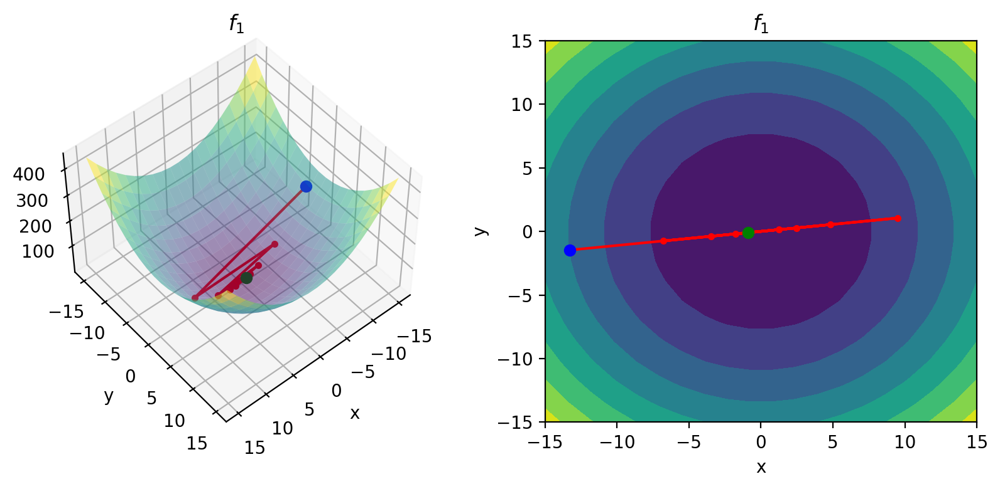

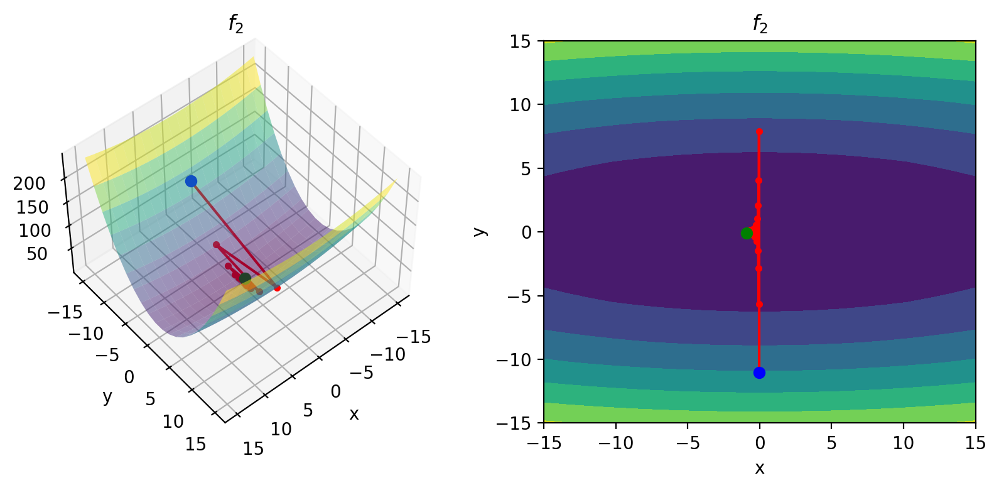

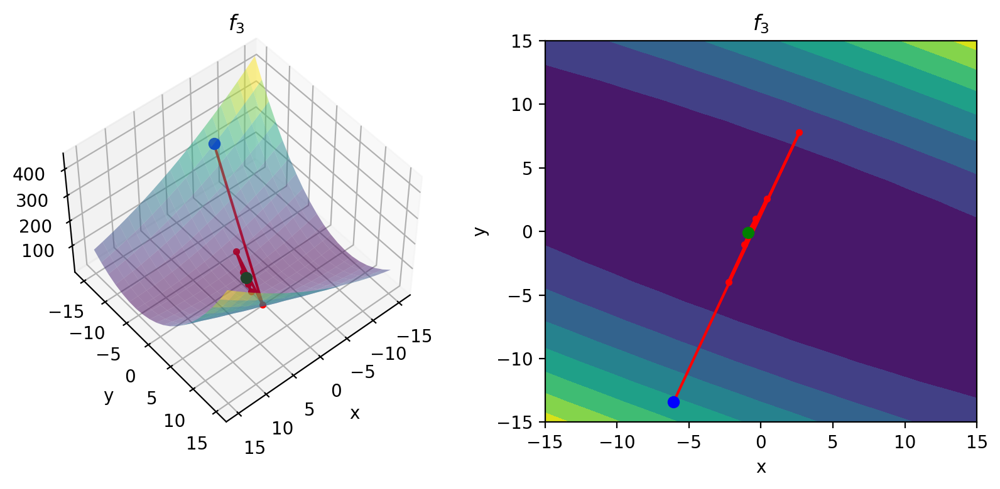

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|∞|-|-|∞|∞
$f_2$|∞|-|-|∞|∞
$f_3$|∞|-|-|∞|∞


In [19]:
draw_all_functions_constant_step(1.2, scale=(15, 15))

В данном примере, градиентный спуск расходится на всех функциях, за счёт слишком большого значения шага градиентного спуска.

### $\alpha = 0.85$

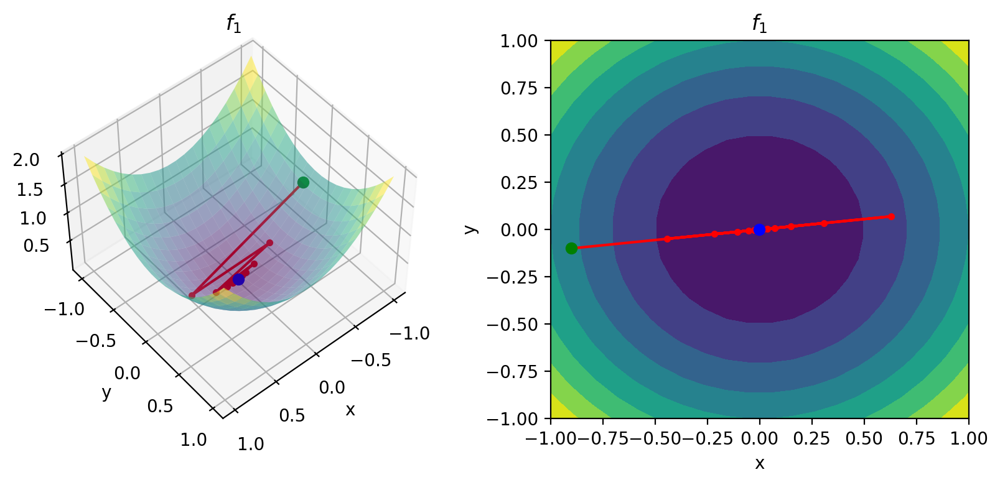

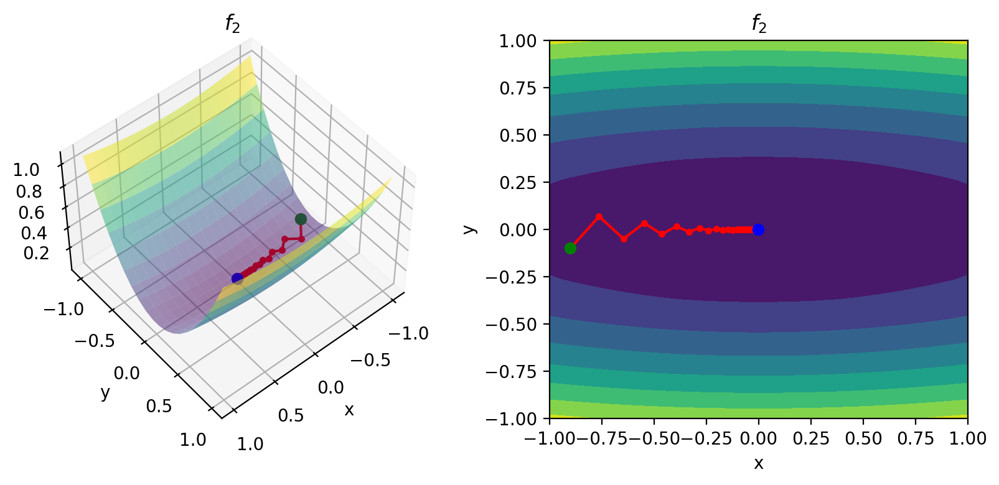

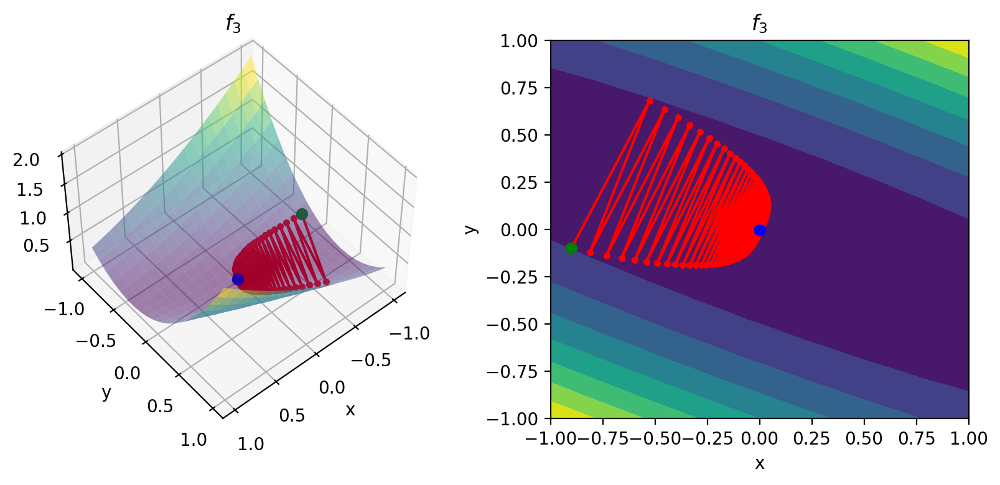

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|28|(-0.001, -0.001)|0|0|28
$f_2$|44|(-0.001, -0.001)|0|0|44
$f_3$|490|(0.002, -0.002)|0|0|490


In [20]:
draw_all_functions_constant_step(0.85)

В данном примере, градиентный спуск сходится к точке минимума для всех функций. 
Для первой функции траектория градиентного спуска постоянно "перепрыгивает" точку минимума, за счёт большого шага градиентного спуска.
Для второй и третьей функций, наблюдается зигзагообразная траектория и увеличение количества итераций с увеличением числа обусловленности, за счёт медленной сходимости по оси $x$. Также заметим, что для ускорения сходимости по оси $x$ значение шага не может быть существенно увеличено для данных функций, так как в этом случае градиентный спуск будет расходиться, аналогично первому примеру.

### $\alpha = 0.4$

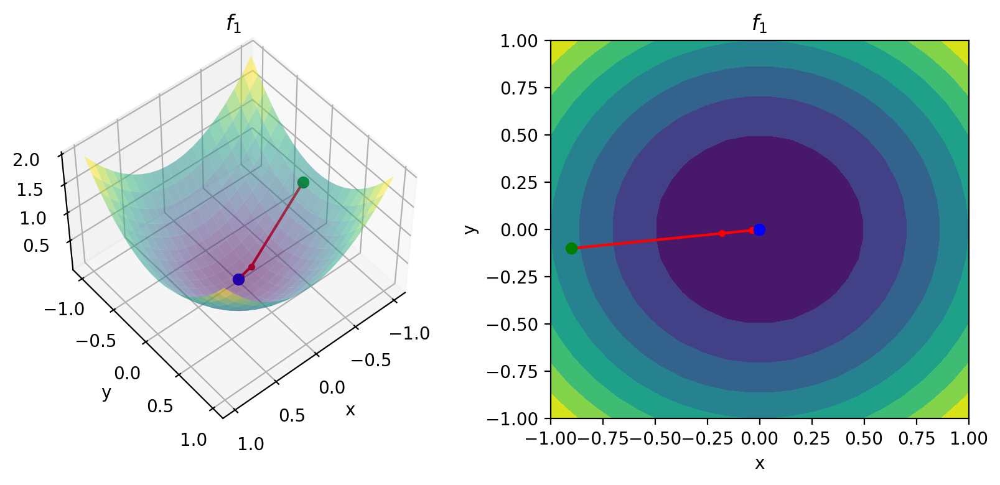

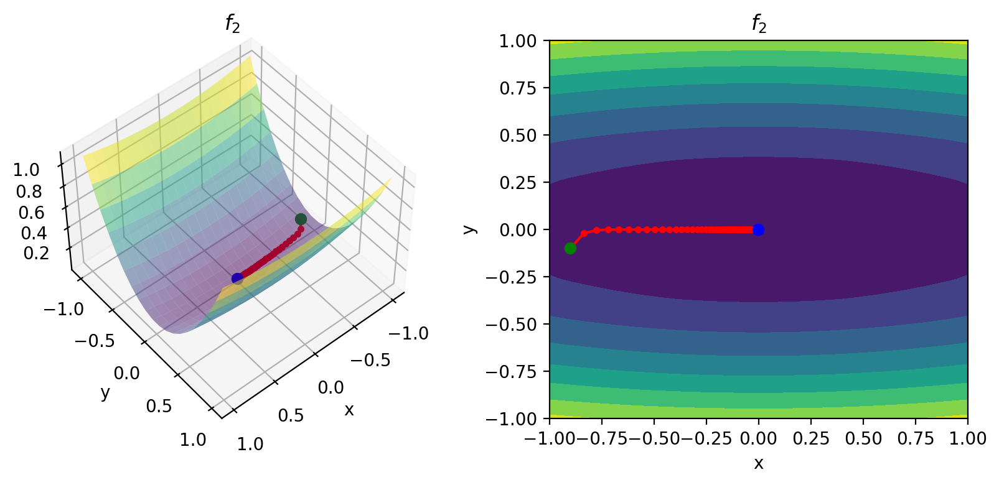

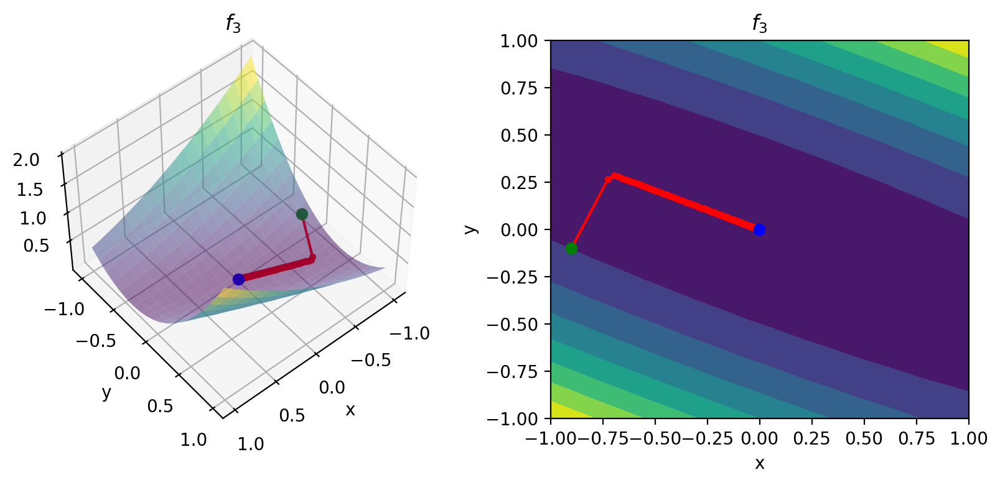

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|6|(-0.001, -0.001)|0|0|6
$f_2$|87|(-0.002, 0)|0|0|87
$f_3$|194|(-0.001, 0)|0|0|194


In [21]:
draw_all_functions_constant_step(0.4)

В данном примере, градиентный спуск сходится к точке минимума для всех функций.
Для первой и третьей функции уменьшилось количество итераций необходимых для сходимости градиентного спуска. 
Также, для второй и третьей функции, траектория градиентного спуска не является зигзагообразной, по сравнению с преыдущим примером.
Аналогично предыдущему примеру, количество итераций возрастает с увеличением числа обусловленности.


### $\alpha = 0.1$

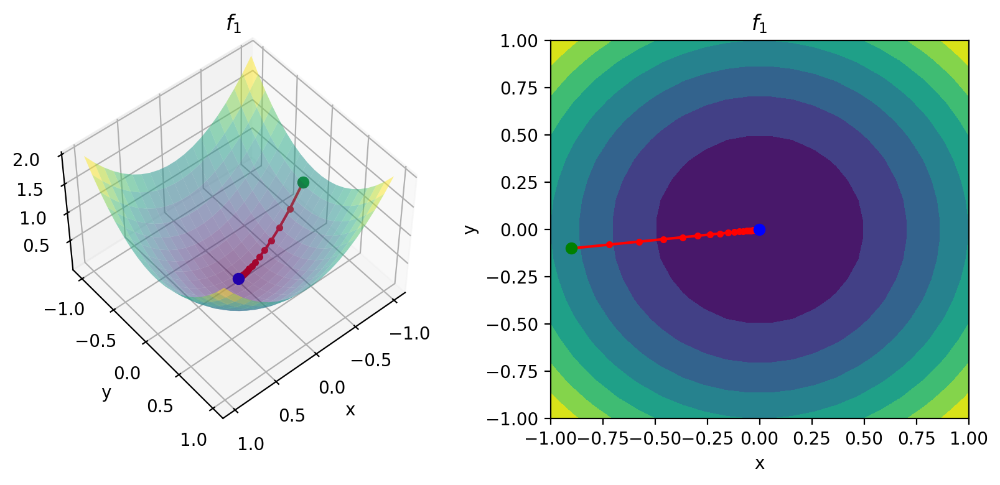

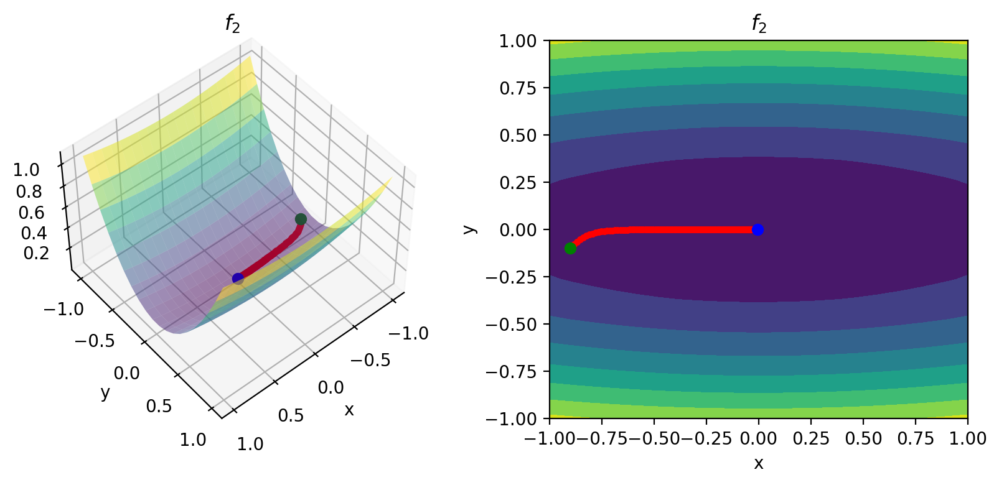

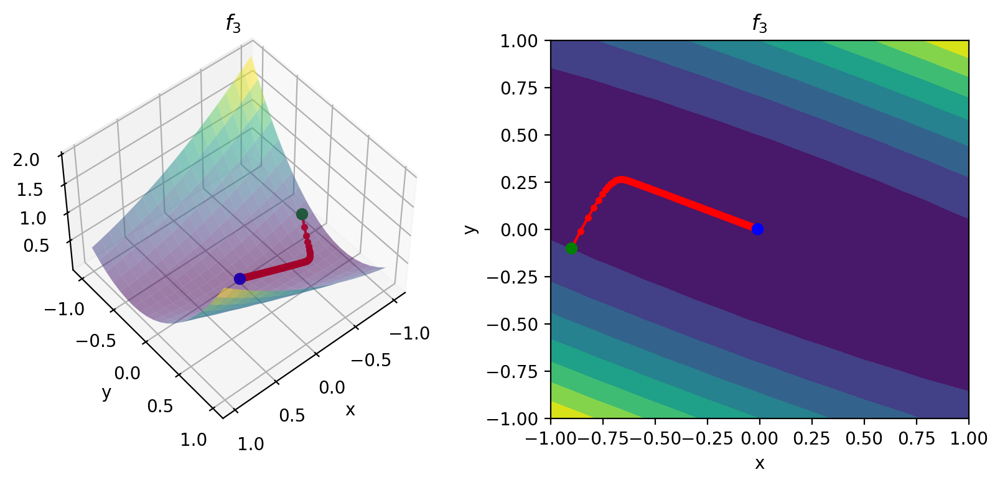

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|34|(-0.001, -0.001)|0|0|34
$f_2$|281|(-0.006, 0)|0|0|281
$f_3$|581|(-0.011, 0.004)|0|0|581


In [22]:
draw_all_functions_constant_step(0.1)

В данном примере, градиентный спуск сходится к точке минимума для всех функций.
За счёт маленького значения шага градиентного спуска, траектория равномерно движется к точке минимума. Количество итераций необходимых для сходимости градиентного спуска возросло по сравнению с предыдущим примером из-за маленького значения шага.

### Анализ на других значениях шага градиентного спуска.

Проанализируем количество итераций необходимых для сходимости в зависимости от размера шага. Для этого рассмотрим шаги равные [1.3, 0.99, 0.95, 0.9, 0.85, 0.6, 0.45, 0.3, 0.1, 0.05, 0.001].

In [23]:
steps = [1.3, 0.99, 0.95, 0.9, 0.85, 0.6, 0.45, 0.3, 0.1, 0.05, 0.001]
total_stat_print = pd.DataFrame(index=f_labels)
total_stat = pd.DataFrame(index=f_labels)

for step in steps:
    it_cnt_for_step = []
    it_cnt_for_step_print = []
    for f in fs:
        search = constant_step_search(step)
        argmin, stat, _ = search.search_min(x_0, f)
        if converges(f, argmin):
            it_cnt_for_step += [stat.get(Statistics.STEPS)]
            it_cnt_for_step_print += [format_num(stat.get(Statistics.STEPS))]
        else:
            it_cnt_for_step += [float("inf")]
            it_cnt_for_step_print += [INF_CHAR]
    total_stat[step] = it_cnt_for_step
    total_stat_print[step] = it_cnt_for_step_print

df_to_markdown(total_stat_print, "Функция")

Функция|1.3|0.99|0.95|0.9|0.85|0.6|0.45|0.3|0.1|0.05|0.001
---|---|---|---|---|---|---|---|---|---|---|---
$f_1$|∞|485|93|44|28|6|4|10|34|65|1447
$f_2$|∞|376|72|42|44|61|79|112|281|487|2678
$f_3$|∞|∞|∞|∞|490|138|176|246|581|963|1058


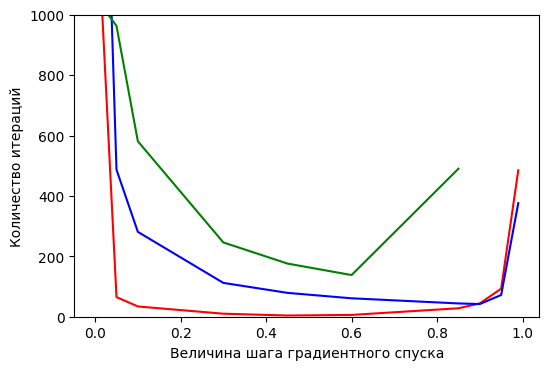

In [24]:
fig = plt.figure(dpi=100)
ax = plt.subplot()
ax.set_ylim([0, 1000])
ax.set_ylabel("Количество итераций")
ax.set_xlabel("Величина шага градиентного спуска")
ax.plot(steps, total_stat.loc[f_1_label].to_numpy(), c='r')
ax.plot(steps, total_stat.loc[f_2_label].to_numpy(), c='b')
ax.plot(steps, total_stat.loc[f_3_label].to_numpy(), c='g')
plt.show()

На основе данных из таблицы и графика зависимости количества итераций от значения шага градиентного спуска, можно сделать вывод, что количество итераций изначально убывает с возрастанием градиентного спуска, а после возрастает вплоть
до того, что градиентный спуск перестает сходится. Также, с увеличением числа обусловленности возрастает количество итераций, необходимых для сходимости.

Таким образом, можно сформулировать общие выводы:

* Значение шага влияет на сходимость градиентного спуска. 
* При уменьшении значения шага, с некоторого момента увеличивается количество итераций.
* При увеличении значения шага, с некоторого момента увеличивается количество итераций, вплоть до расходимости.
* При увеличении числа обусловленности функции, увеличивается количество итераций необходимых для сходимости. 

## Анализ сходимости градиентного спуска с использованием метода золотого сечения

Рассмотрим траекторию градиентного спуска и количество итераций необходимых для cходимости градиетному спуску с использованием метода золотого сечения, с максимальным значением шага $\alpha = [1.2, 0.4, 0.1]$

In [25]:
def draw_all_functions_golden_search(step, scale=(1, 1)):
    stat_f1 = draw_golden_search(f_1_label, step, f_1, x_0, scale=scale)
    stat_f2  = draw_golden_search(f_2_label, step, f_2, x_0, scale=scale)
    stat_f3 = draw_golden_search(f_3_label, step, f_3, x_0, scale=scale)
    stat = pd.concat([stat_f1, stat_f2, stat_f3])
    plt.show()
    return df_to_markdown(stat, "Функция")

### $\alpha = 1.2$

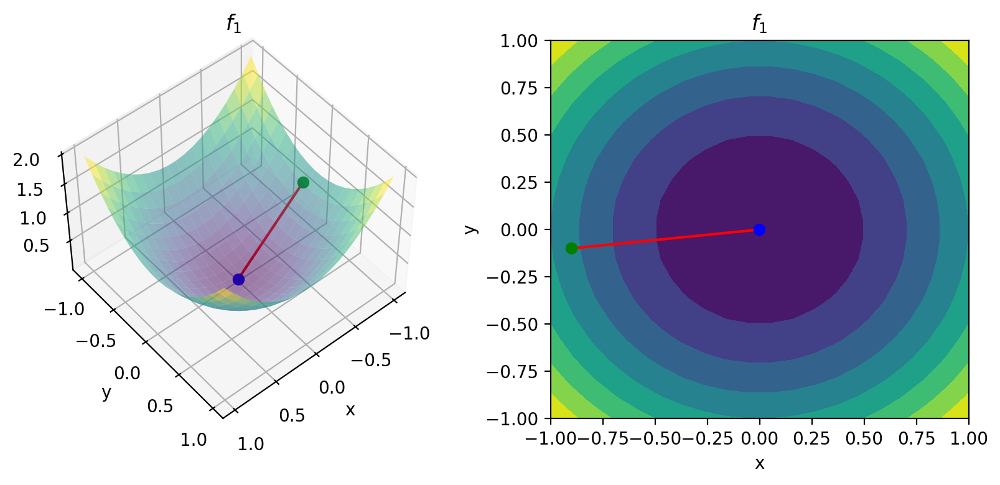

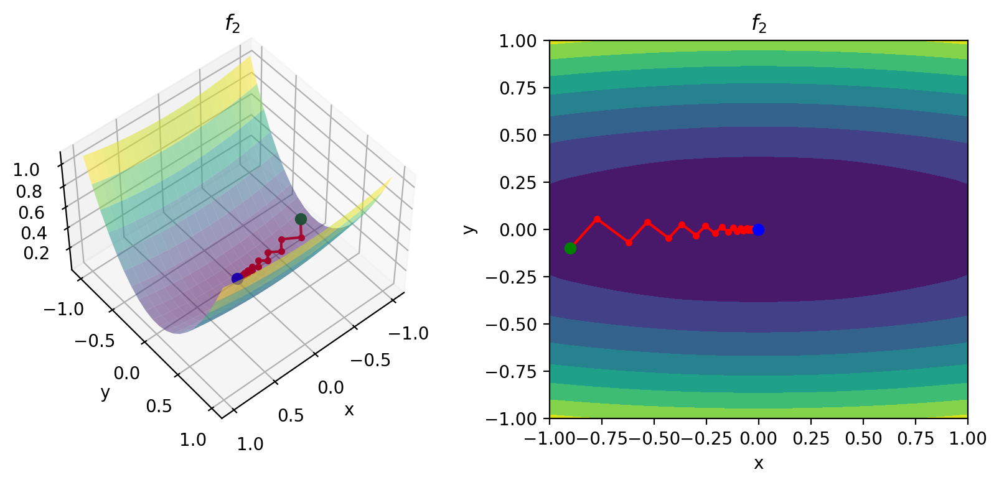

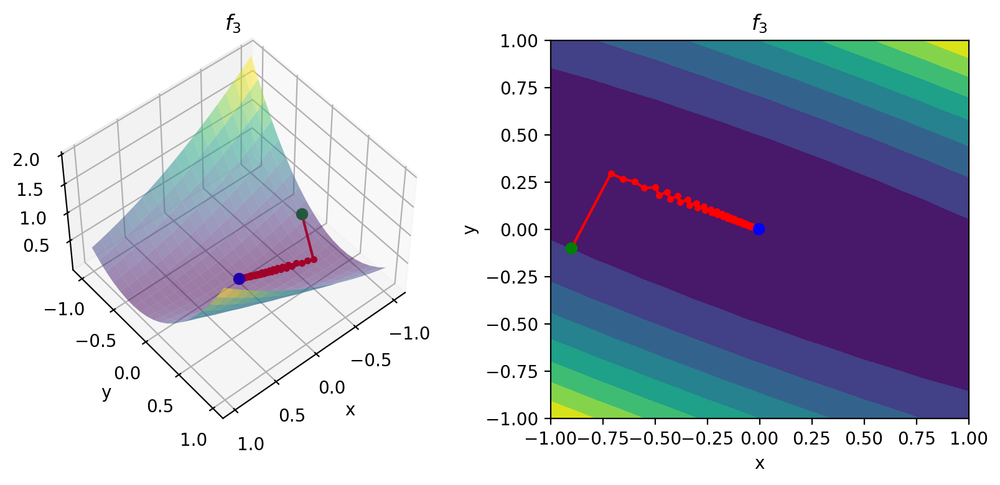

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|1|(0, 0)|0|17|1
$f_2$|31|(-0.003, 0)|0|527|31
$f_3$|68|(-0.006, 0.002)|0|1156|68


In [26]:
draw_all_functions_golden_search(1.2)

В приведённом примере, градиентный спуск с методом золотого сечения сходится к точке минимума для всех функций.
Также с увеличением числа обусловленности возрастает количество итераций и количество вычислений функции необходимых для 
сходимости и траектория принимает зигзагообразный вид.

### $\alpha = 0.4$

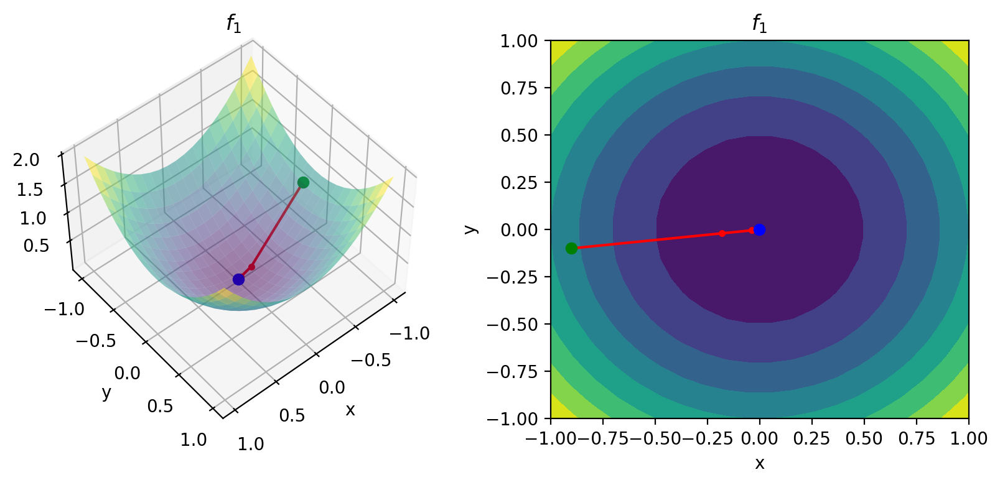

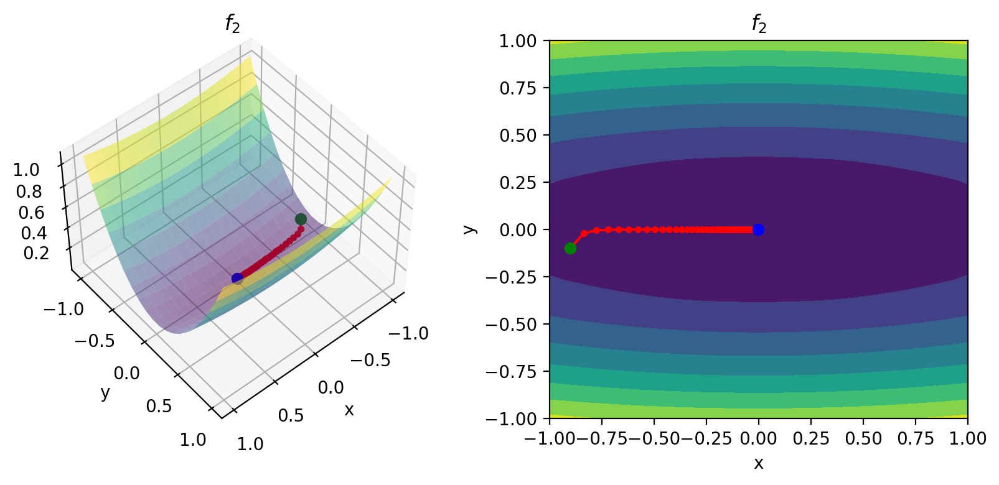

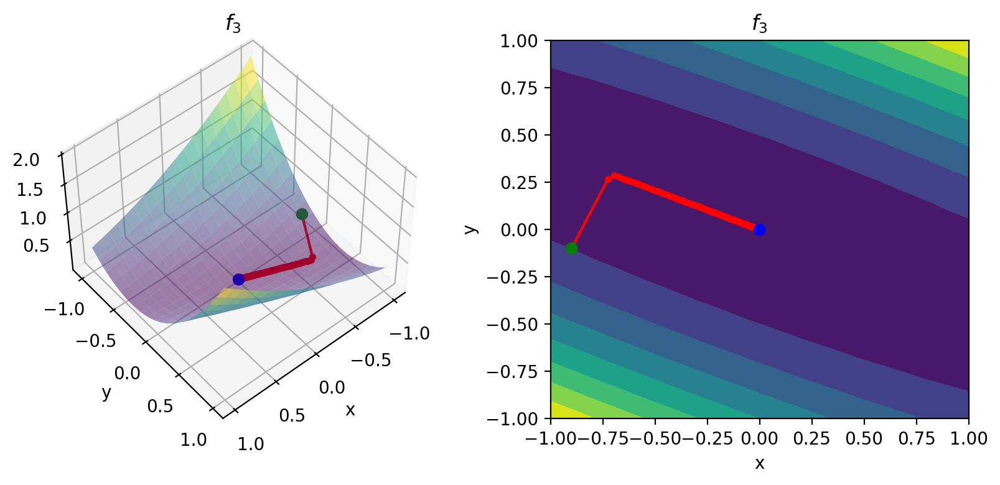

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|6|(-0.001, -0.001)|0|90|6
$f_2$|87|(-0.002, 0)|0|1305|87
$f_3$|194|(-0.001, 0)|0|2910|194


In [27]:
draw_all_functions_golden_search(0.4)

В приведённом примере, градиентный спуск с методом золотого сечения сходится к точке минимума для всех функций. За счёт уменьшения значения максимального шага, возросло количество итераций и вычислений функции. Также, для плохо обусловленных функций, траектория перестала быть зигзагообразной.

### $\alpha = 0.1$

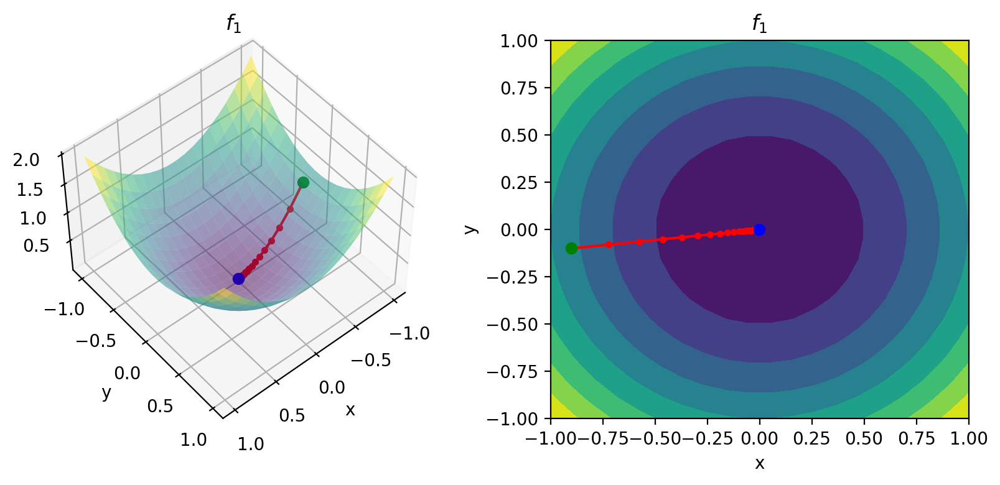

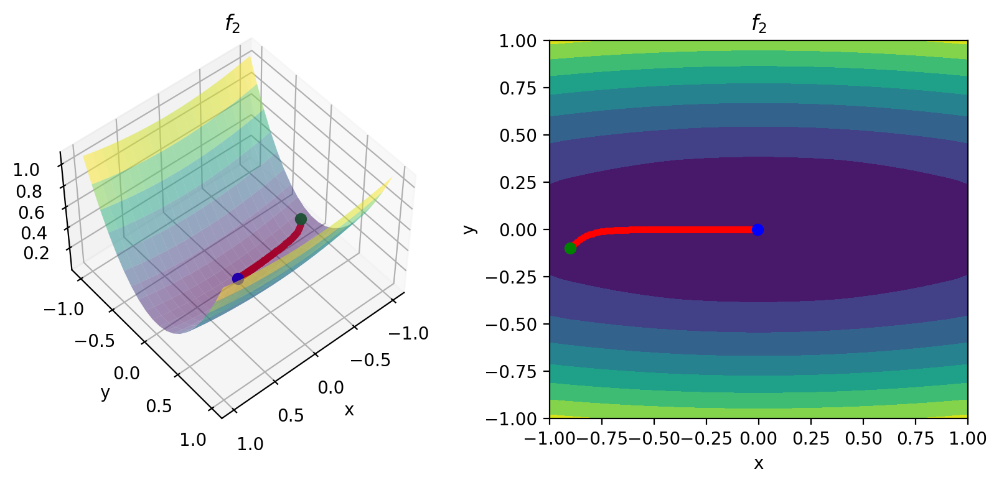

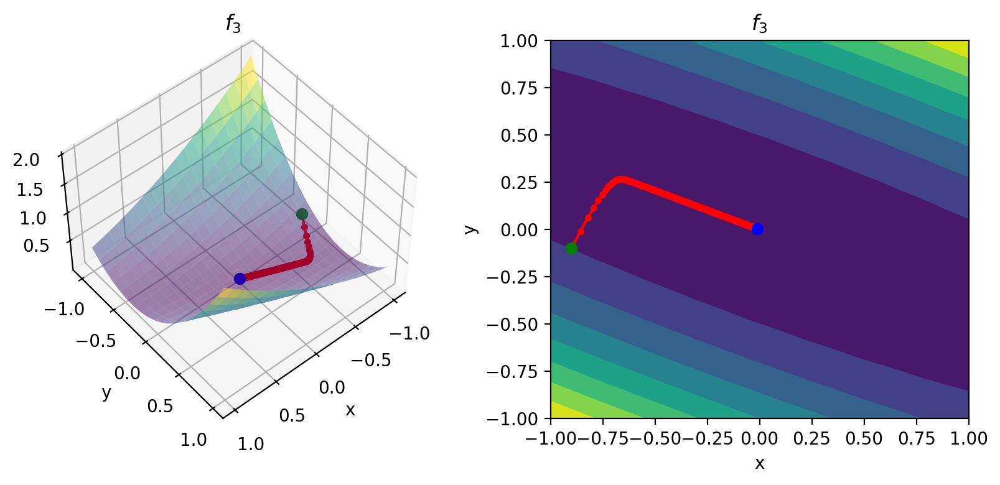

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|34|(-0.001, -0.001)|0|408|34
$f_2$|281|(-0.006, 0)|0|3372|281
$f_3$|583|(-0.011, 0.004)|0|6996|583


In [28]:
draw_all_functions_golden_search(0.1)

В приведённом примере, градиентный спуск с методом золотого сечения сходится к точке минимума для всех функций. Траектория эквивалентна примеру с $\alpha = 0.4$, но количество итераций и количество вычислений функции увеличилось.

### Анализ на разных значениях максимального шага

In [29]:
steps = [50, 10, 3, 2.5, 1.2, 0.85, 0.6, 0.4, 0.1, 0.05]
total_stat_it = pd.DataFrame(index=f_labels)
total_stat_f = pd.DataFrame(index=f_labels)

for step in steps:
    it_cnt_for_step = []
    f_cnt_for_step = []
    for f in fs:
        search = golden_search(step)
        argmin, stat, _ = search.search_min(x_0, f)
        it_cnt_for_step += [stat.get(Statistics.STEPS)]
        f_cnt_for_step += [stat.get(Statistics.FUNCTION)]
    total_stat_it[step] = it_cnt_for_step
    total_stat_f[step] = f_cnt_for_step

show_md("*Количество итераций/вычислений градиентов*")
df_to_markdown(total_stat_it, "Функция")
show_md("*Количество вычислений функции*")
df_to_markdown(total_stat_f, "Функция")

*Количество итераций/вычислений градиентов*

Функция|50.0|10.0|3.0|2.5|1.2|0.85|0.6|0.4|0.1|0.05
---|---|---|---|---|---|---|---|---|---|---
$f_1$|2|2|1|1|1|2|2|6|34|66
$f_2$|22|22|24|24|31|44|61|87|281|489
$f_3$|23|27|39|43|68|93|134|194|583|967


*Количество вычислений функции*

Функция|50.0|10.0|3.0|2.5|1.2|0.85|0.6|0.4|0.1|0.05
---|---|---|---|---|---|---|---|---|---|---
$f_1$|50|44|19|19|17|34|32|90|408|726
$f_2$|550|484|456|456|527|748|976|1305|3372|5379
$f_3$|575|594|741|817|1156|1581|2144|2910|6996|10637


На основе данных из таблицы, можно сделать вывод, что при увеличении максимального значения шага, возрастает количество вычислений функции необходимых для сходимости, за счёт того что интервал поиска оптимального значения шага увеличивается, количество итераций же уменьшается. При уменьшении значения максимального шага, увеличивается количество итераций необходимых для сходимости, а следовательно и количество вычислений функции.
Также с увеличением числа обусловленности функции возрастает количество итераций и количество вычислений функции.

Таким образом, можно сформулировать общие выводы:

* При выборы достаточно большого значения максимального шага, можно сократить количество итераций необходимых для сходимости, за счёт увеличения количества вычислений функции.
* При увеличении числа обусловленности функции, возрастает количество итераций и количество вычислений функции необходимых для сходимости.

## Анализ градиентного спуска с условием Вольфе

Рассмотрим сходимость градиентного спуска с условием Вольфе с параметрами $c_1 = 0.001$, $c_2 = 0.1$ и $c_1 = 0.3$, $c_2 = 0.9$

In [30]:
def draw_all_functions_wolfe_search(c1, c2, scale=(1, 1)):
    stat_f1 = draw_wolfe_search(f_1_label, c1, c2, f_1, x_0, scale=scale)
    stat_f2  = draw_wolfe_search(f_2_label, c1, c2, f_2, x_0, scale=scale)
    stat_f3 = draw_wolfe_search(f_3_label, c1, c2, f_3, x_0, scale=scale)
    stat = pd.concat([stat_f1, stat_f2, stat_f3])
    plt.show()
    return df_to_markdown(stat, "Функция")

### $c_1 = 0.001$, $c_2 = 0.1$

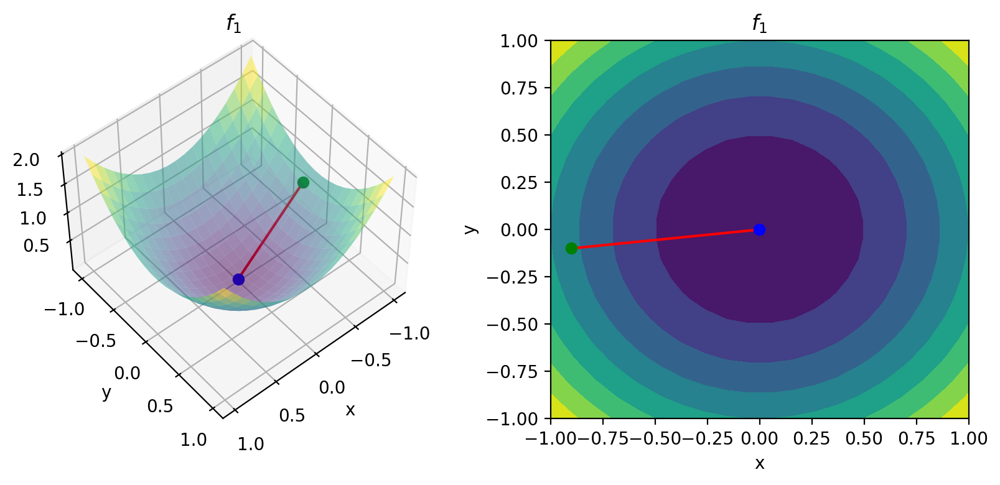

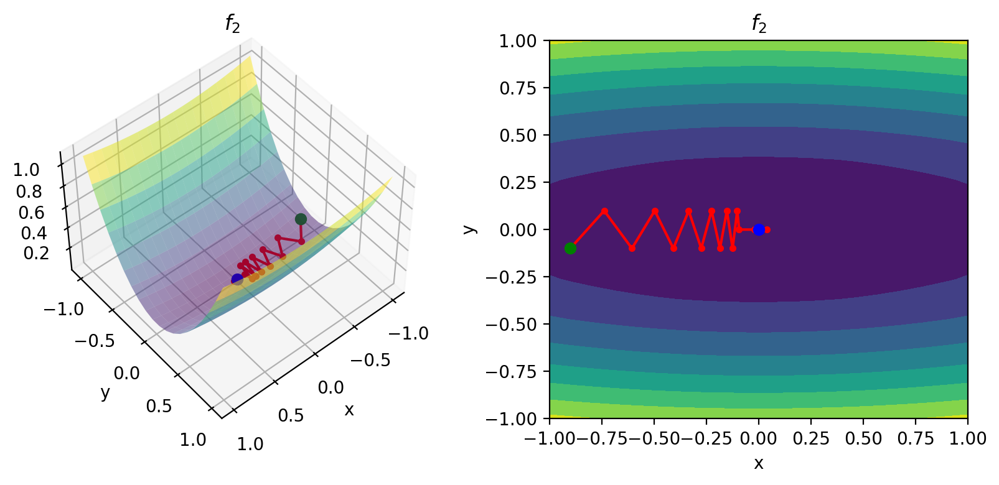

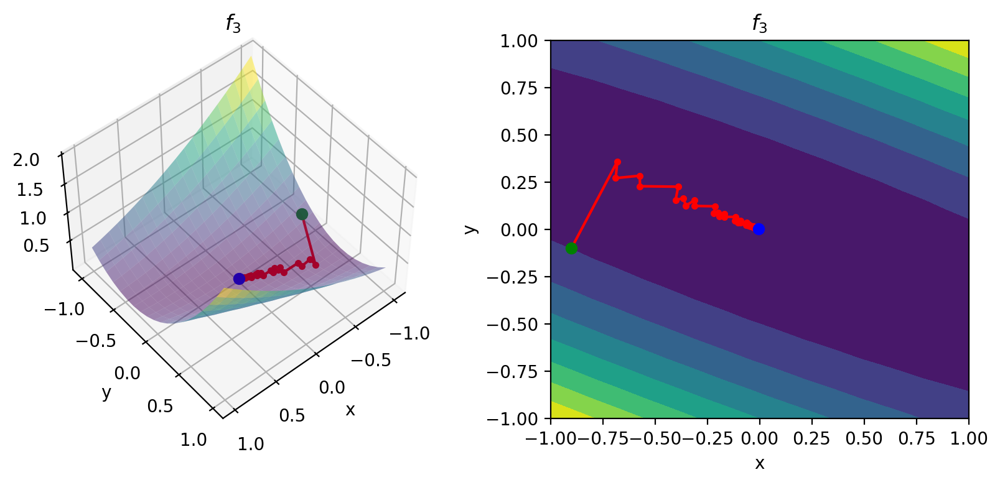

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|1|(-0.001, 0)|0|3|3
$f_2$|19|(0, 0)|0|61|78
$f_3$|45|(-0.005, 0.002)|0|130|155


In [31]:
draw_all_functions_wolfe_search(0.01, 0.1)

### $c_1 = 0.3$, $c_2 = 0.9$

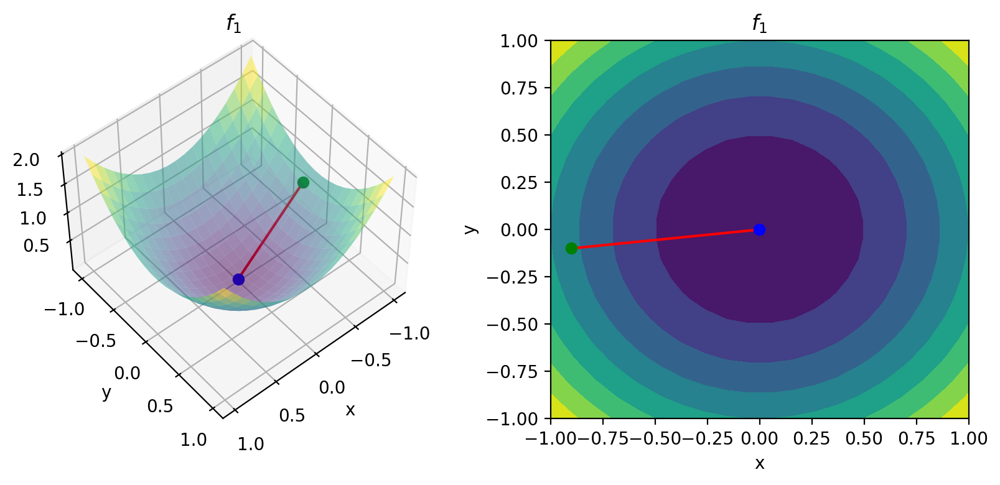

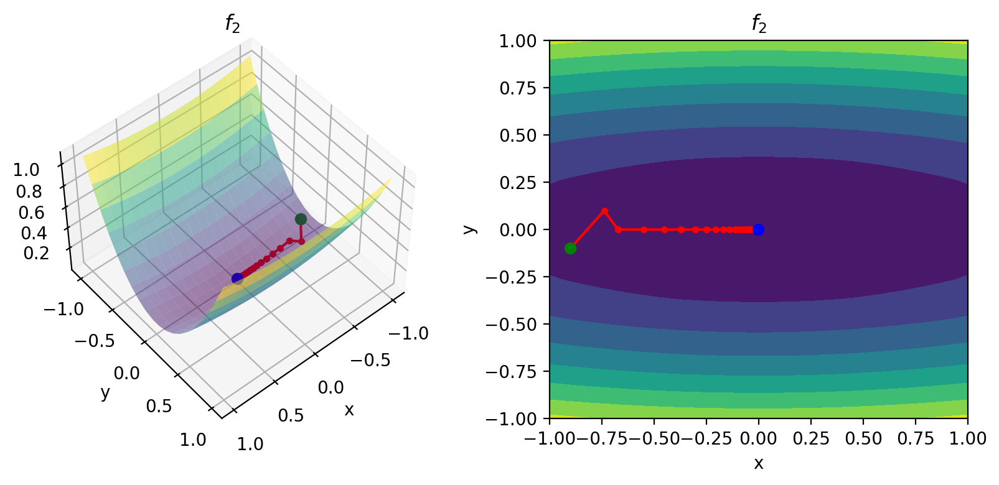

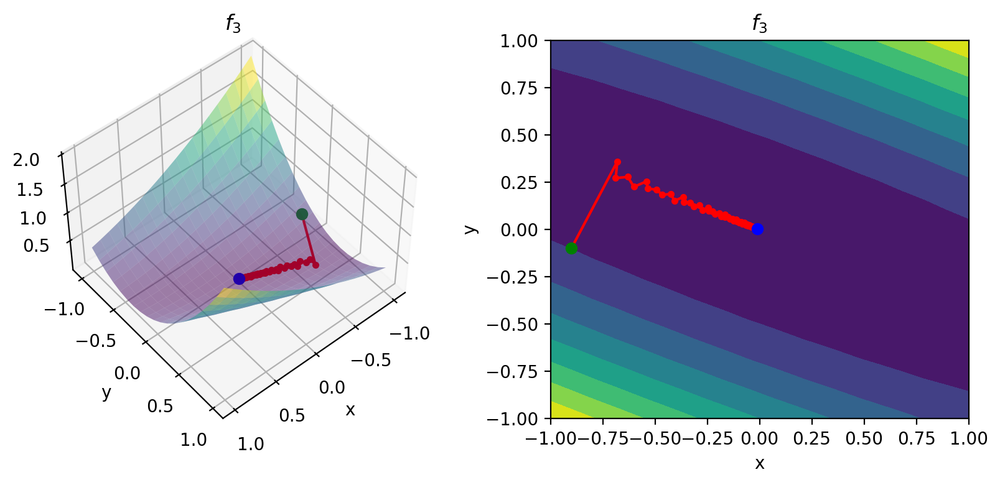

Функция|Количество итераций|Точка минимума|Значение в точке минимума|Количество вычислений функции|Количество вычислений градиента
---|---|---|---|---|---
$f_1$|1|(-0.001, 0)|0|3|3
$f_2$|38|(-0.001, 0)|0|77|114
$f_3$|66|(-0.009, 0.004)|0|149|198


In [32]:
draw_all_functions_wolfe_search(0.3, 0.9)

В приведённых примерах, градиентный спуск с условием Вольфе сходится к точке минимума для всех функций. За счёт дополнительных вычислений функции и градиентов, уменьшилось количество итераций необходмых для сходимости по 
сравнению с градиентным спуском с постоянным шагом, но при этом количество вычислений функции уменьшилось по сравнению с градиентным спуском с методом золотого сечения.

## Cравнение сходимости методов

Сравним количество количество итераций, вычислений градиентов и вычислений функций для трёх методов

* Градиентный спуск с постоянным шагом $\alpha = 0.3$  
* Градиентный спуск с методом золотого сечения с максимальным шагом $\alpha = 2$  
* Градиентный спуск с условием Вольфе $c_1 = 0.3$ и $c_2 = 0.9$  

In [33]:
сonstant = constant_step_search(0.3)
golden = golden_search(2)
wolfe = wolfe_search(0.3, 0.9)

searches = [("Постоянный шаг", сonstant), ("Условие Вольфе", wolfe), ("Метод золотого сечения", golden)]

stat = pd.DataFrame(index=f_labels)

def show_stat(stat_name, stat_key):
    show_md(f"**{stat_name}**")
    stat = pd.DataFrame(index=f_labels)
    for label, search in searches:
        stat_for_f = []
        for f in fs:    
            _, search_stat, _ =  search.search_min(x_0, f)      
            stat_for_f += [search_stat.get(stat_key)]
        stat[label] = stat_for_f
    df_to_markdown(stat, "Функция")

show_stat(it_cnt, Statistics.STEPS)
show_stat(f_cnt, Statistics.FUNCTION)
show_stat(grad_cnt, Statistics.GRADIENT)


**Количество итераций**

Функция|Постоянный шаг|Условие Вольфе|Метод золотого сечения
---|---|---|---
$f_1$|10|1|2
$f_2$|112|38|27
$f_3$|246|66|53


**Количество вычислений функции**

Функция|Постоянный шаг|Условие Вольфе|Метод золотого сечения
---|---|---|---
$f_1$|0|3|36
$f_2$|0|77|486
$f_3$|0|149|954


**Количество вычислений градиента**

Функция|Постоянный шаг|Условие Вольфе|Метод золотого сечения
---|---|---|---
$f_1$|10|3|2
$f_2$|112|114|27
$f_3$|246|198|53


По представленным данным, можно сделать вывод, что градиентный спуск с постоянным шагом требует наибольшего количества итераций для сходимости. Количество итераций для сходимости можно уменьшить применим градиентный спуск с методом
золотого сечения, при этом возрастёт количество вычислений функции. Уменьшить количество вычислений функции можно с помощью градиентного спуска с условием Вольфе, при это количество итераций для сходимости будет немного больше, 
а количество вычислений градиента не больше чем при вычислении методом градиентного спуска с постоянным шагом.

Таким образом можно сделать общие выводы по сходимости методов:

* Сходимость градиентного спуска с постоянным шагом сильно зависит от выбора шага и требует наибольшего количества итераций для сходимости по сравнений с остальными методами.
* Использование градиентного спуска с методом золого сечения уменьшает количество итераций необходимых для сходимости, при этом возрастает количество вычислений функции.
* Использование градиентного спуска с условием Вольфе позволяет уменьшить количество итераций, необходимых для сходимости, при этом количество вычислений градиента не больше чем в градиентном спуске с постоянным шагом, а количество
вычислений функции меньше чем в градиентном спуске с методом золотого сечения.

## Анализ работы методов в зависимости от выбора начальной точки

Рассмотрим работу методов в зависимости от выборы начальной точки на примере точек $(-1, -0.2)$, $(-2, -10)$, $(-7.2, -7.2)$

In [34]:
x_1 = np.array([-0.2, -3])
x_1_str = r"(-0.2\ {-3})"
x_1_label = "$x_1$"

x_2 = np.array([-2.16, -2.16])
x_2_str = r"(-2.16\ {-2.16})"
x_2_label = "$x_2$"

x_3 = np.array([-3, -0.2])
x_3_str = r"(-3\ {-0.2})"
x_3_label = "$x_3$"

def draw_all_functions_with_start_constant_step(x_0, scale=(1, 1)):
    stat_f1 = draw_constant_step_search(f_1_label, 0.3, f_1, x_0, scale=scale)[it_cnt]
    stat_f2  = draw_constant_step_search(f_2_label, 0.3, f_2, x_0, scale=scale)[it_cnt]
    stat_f3 = draw_constant_step_search(f_3_label, 0.3, f_3, x_0, scale=scale)[it_cnt]
    stat = pd.concat([stat_f1, stat_f2, stat_f3])
    plt.show()
    return stat

def draw_all_functions_with_start_golden(x_0, scale=(1, 1)):
    stat_f1 = draw_golden_search(f_1_label, 2, f_1, x_0, scale=scale)[it_cnt]
    stat_f2  = draw_golden_search(f_2_label, 2, f_2, x_0, scale=scale)[it_cnt]
    stat_f3 = draw_golden_search(f_3_label, 2, f_3, x_0, scale=scale)[it_cnt]
    stat = pd.concat([stat_f1, stat_f2, stat_f3])
    plt.show()
    return stat

def draw_all_functions_with_start_wolfe(x_0, scale=(1, 1)):
    stat_f1 = draw_wolfe_search(f_1_label, 0.001, 0.1, f_1, x_0, scale=scale)[it_cnt]
    stat_f2  = draw_wolfe_search(f_2_label, 0.001, 0.1, f_2, x_0, scale=scale)[it_cnt]
    stat_f3 = draw_wolfe_search(f_3_label, 0.001, 0.1, f_3, x_0, scale=scale)[it_cnt]
    stat = pd.concat([stat_f1, stat_f2, stat_f3])
    plt.show()
    return stat

### Градиентный спуск с постоянным шагом

1. $x_0 = (-0.2\ {-3})$

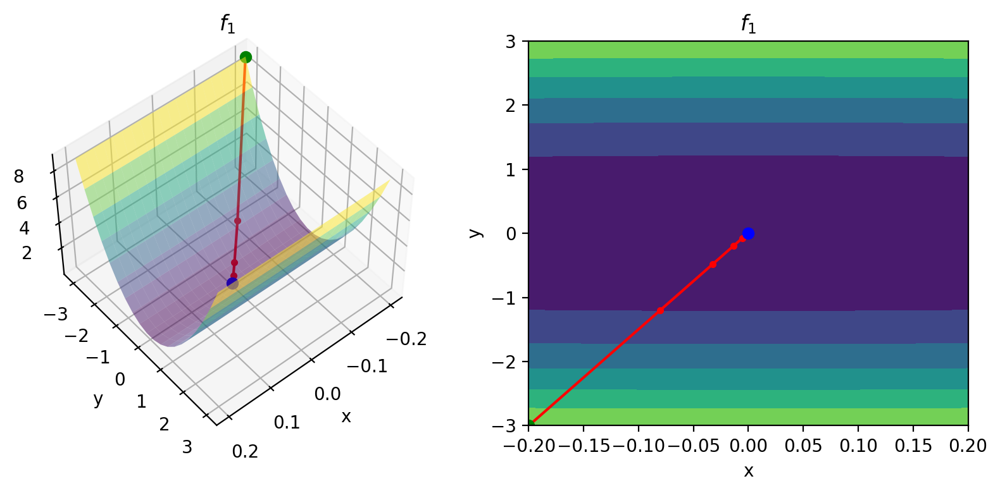

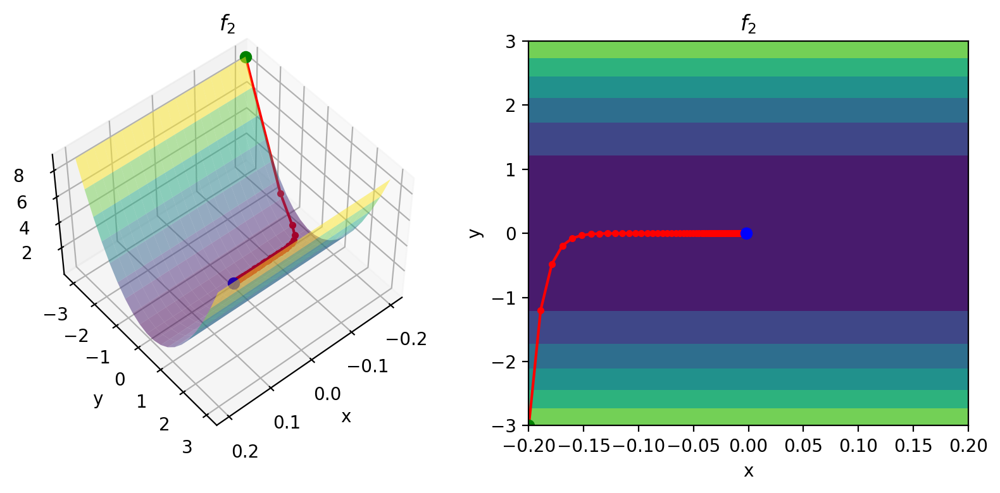

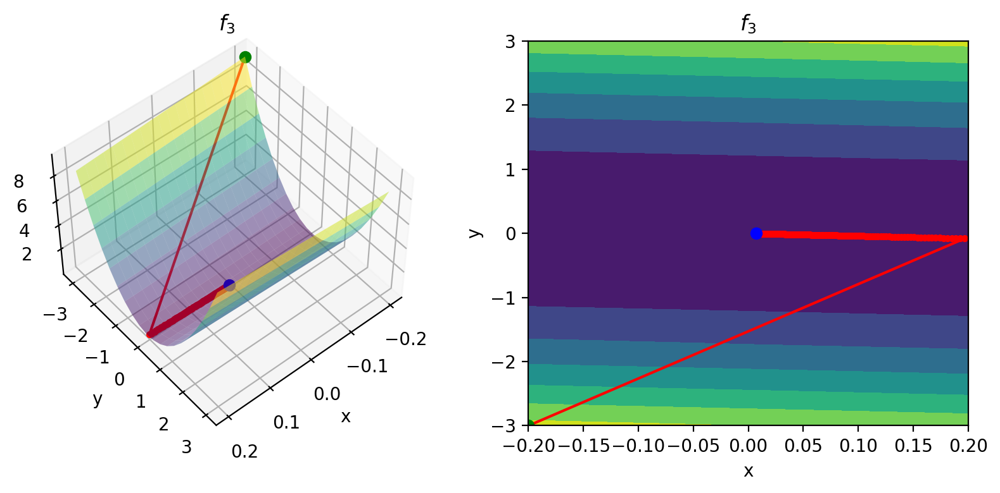

2. $x_0 = (-2.16\ {-2.16})$

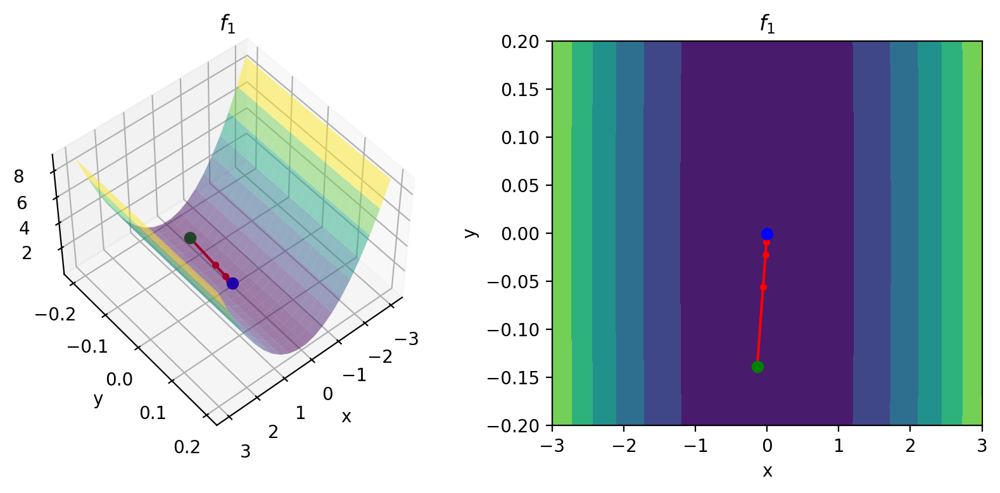

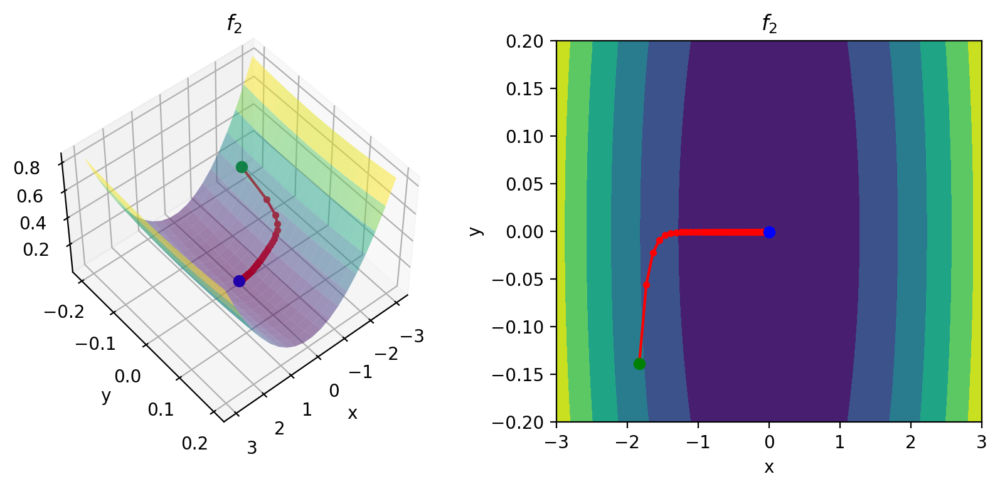

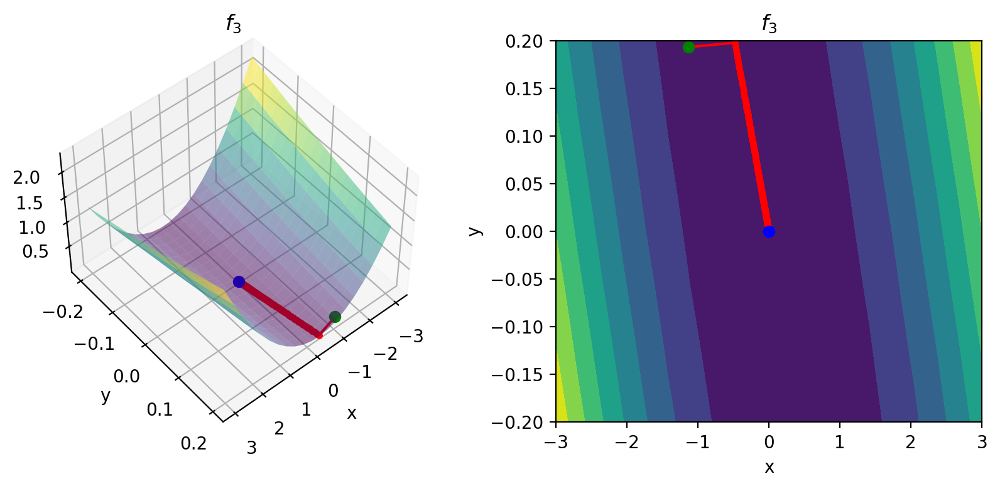

3. $x_0 = (-3\ {-0.2})$

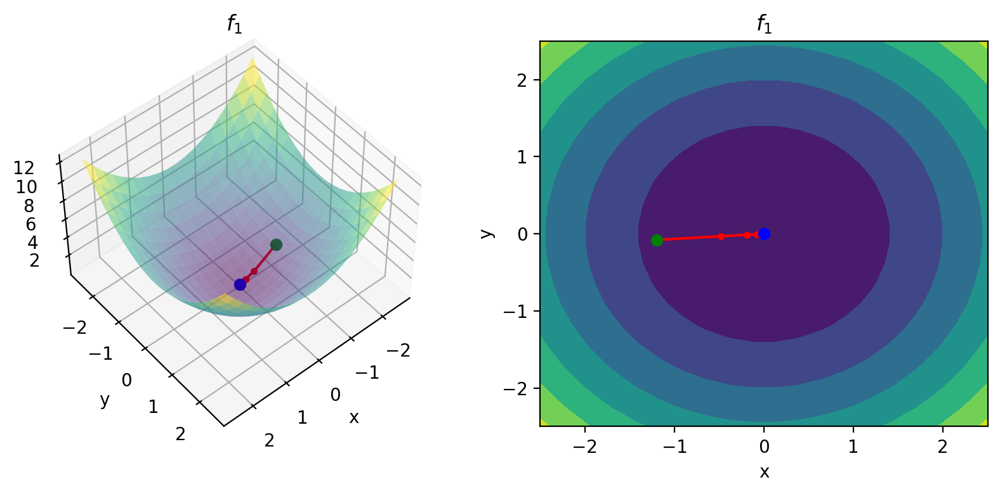

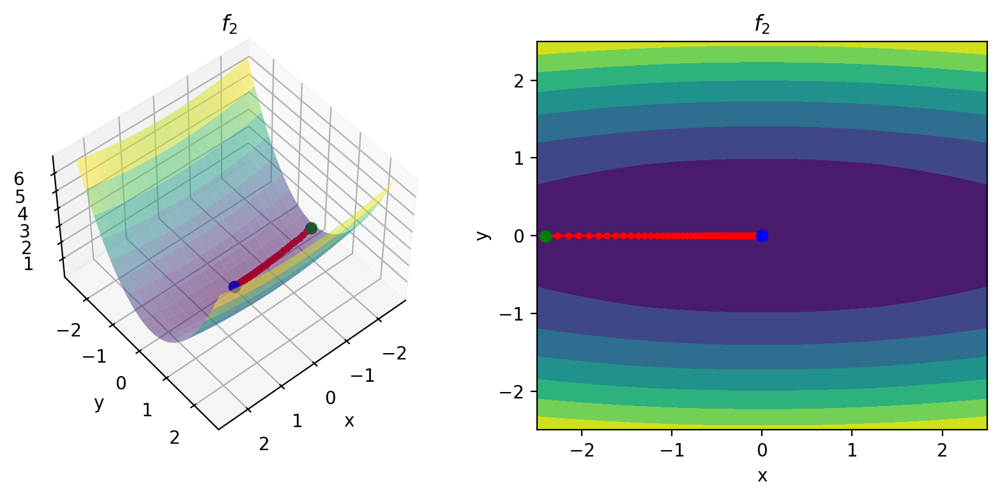

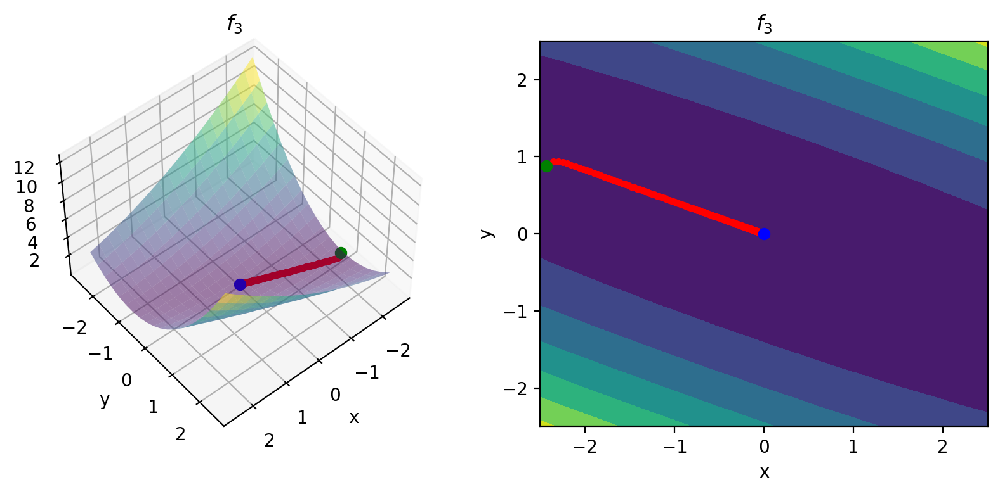

Функция|$x_1$|$x_2$|$x_3$
---|---|---|---
$f_1$|11|11|11
$f_2$|85|128|134
$f_3$|255|264|304


In [35]:
show_md(f"1. $x_0 = {x_1_str}$")
stat_f1 = draw_all_functions_with_start_constant_step(x_1, scale=(0.2, 3))
show_md(f"2. $x_0 = {x_2_str}$")
stat_f2 = draw_all_functions_with_start_constant_step(x_2, scale=(3, 0.2))
show_md(f"3. $x_0 = {x_3_str}$")
stat_f3 = draw_all_functions_with_start_constant_step(x_3, scale=(2.5, 2.5))

stat = pd.DataFrame(index=f_labels)
stat[x_1_label] = stat_f1
stat[x_2_label] = stat_f2
stat[x_3_label] = stat_f3

df_to_markdown(stat, "Функция")

Для функции $f_1$ количество итераций постоянно для выбранных точек. Для функций $f_1$ и $f_2$ количество итераций возрастает при удалении начальной точки от точки минимума $(0, 0)$ по оси
$x$. Можно сделать вывод, что количество итераций необходимых для сходимости зависит от выбора начальной точки.

### Градиентный спуск с методом золотого сечения

1. $x_0 = (-0.2\ {-3})$

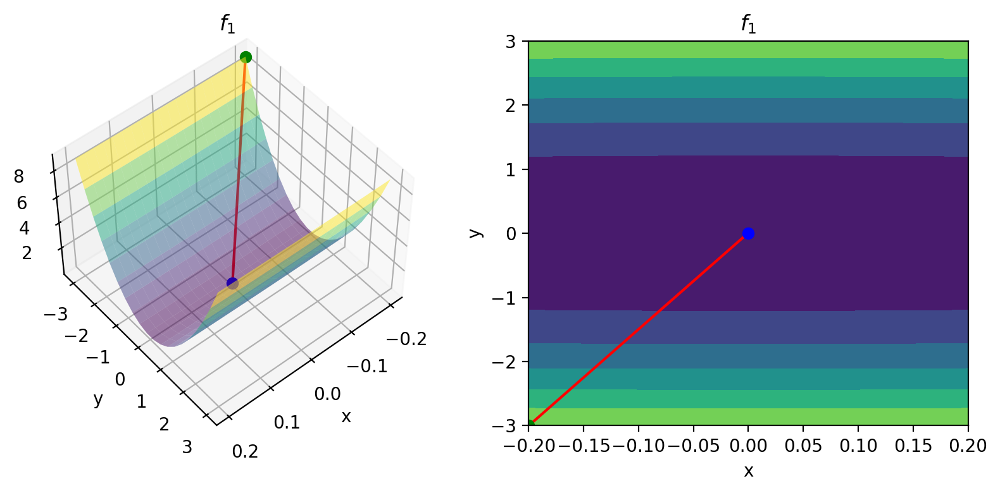

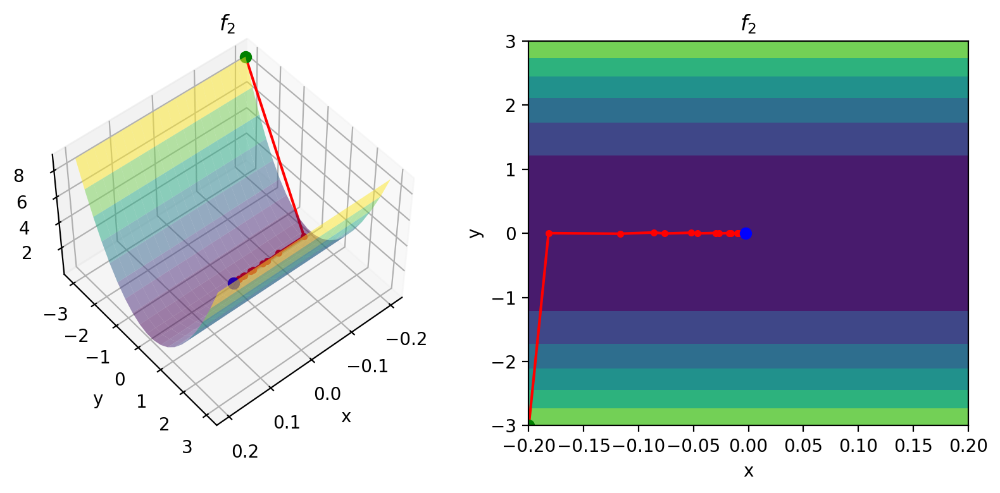

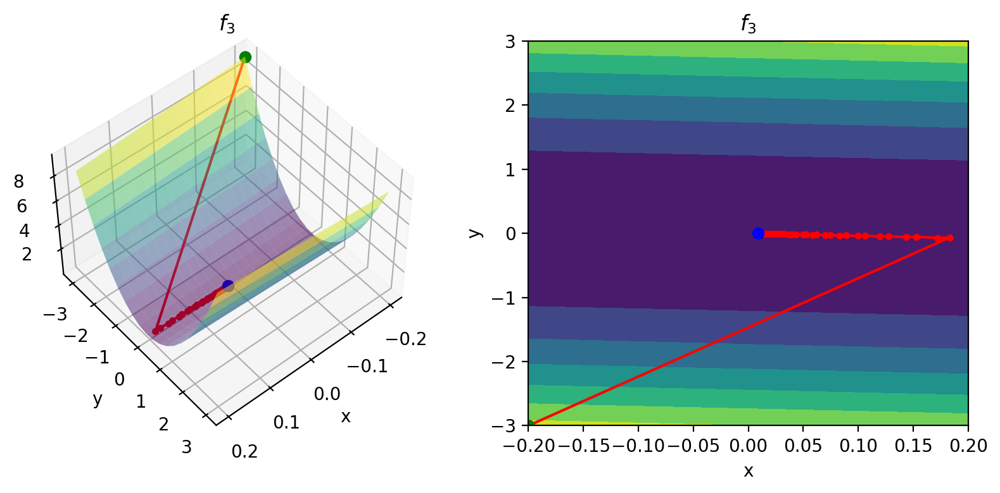

2. $x_0 = (-2.16\ {-2.16})$

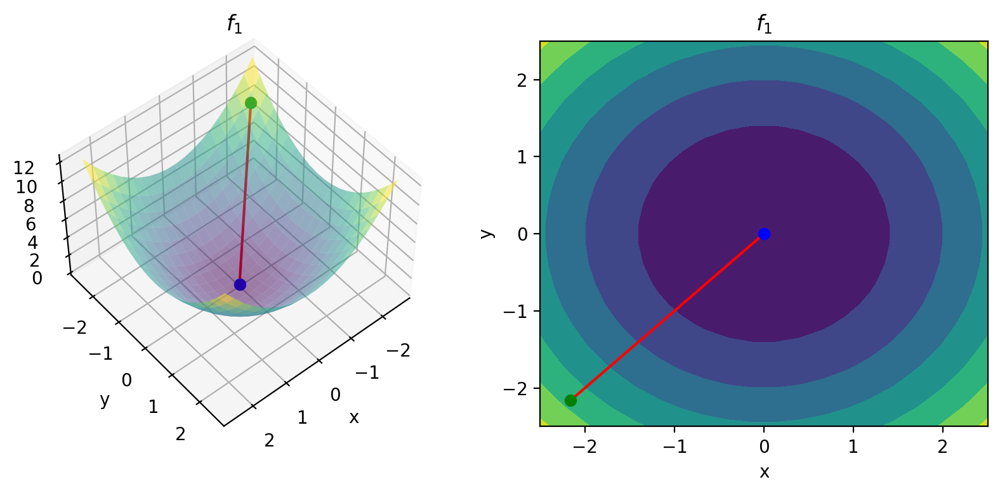

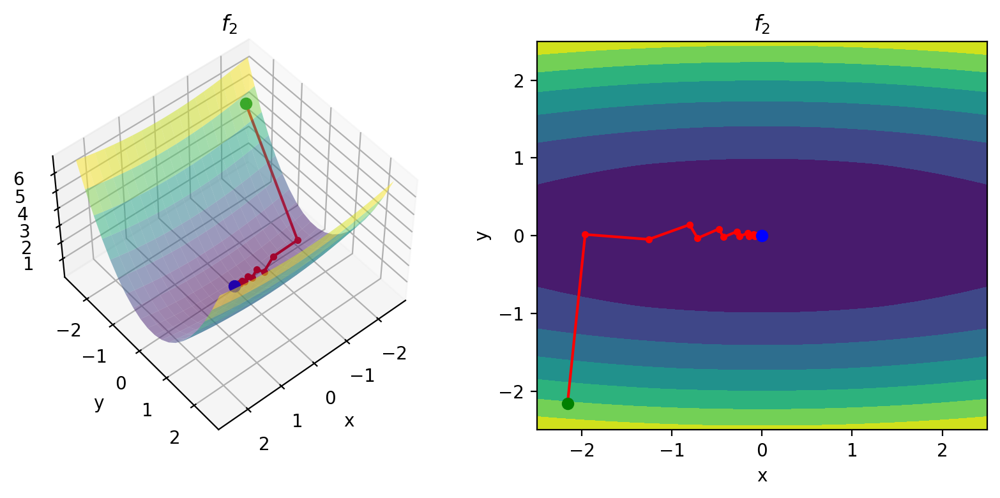

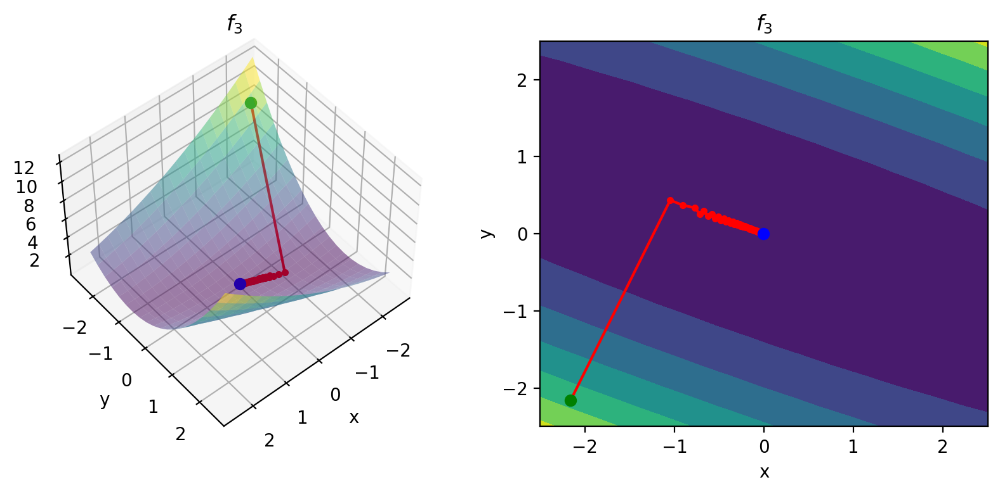

3. $x_0 = (-3\ {-0.2})$

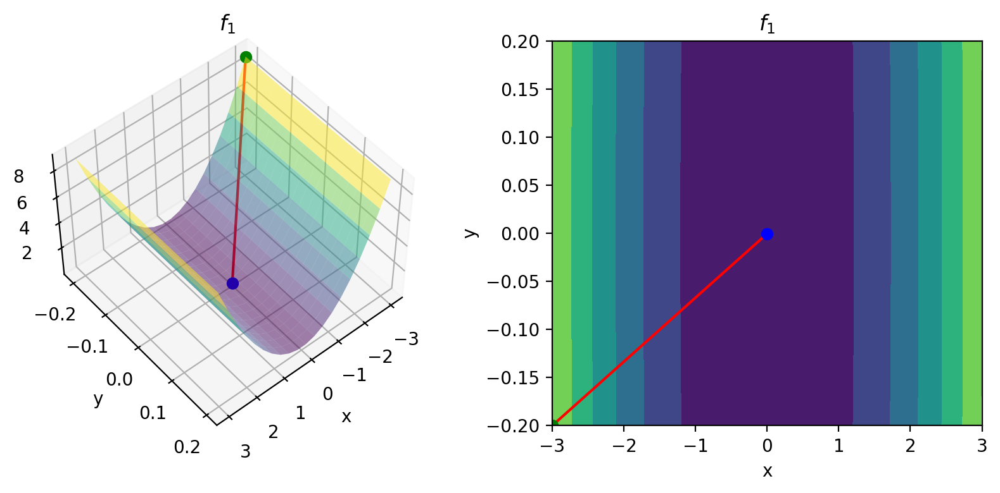

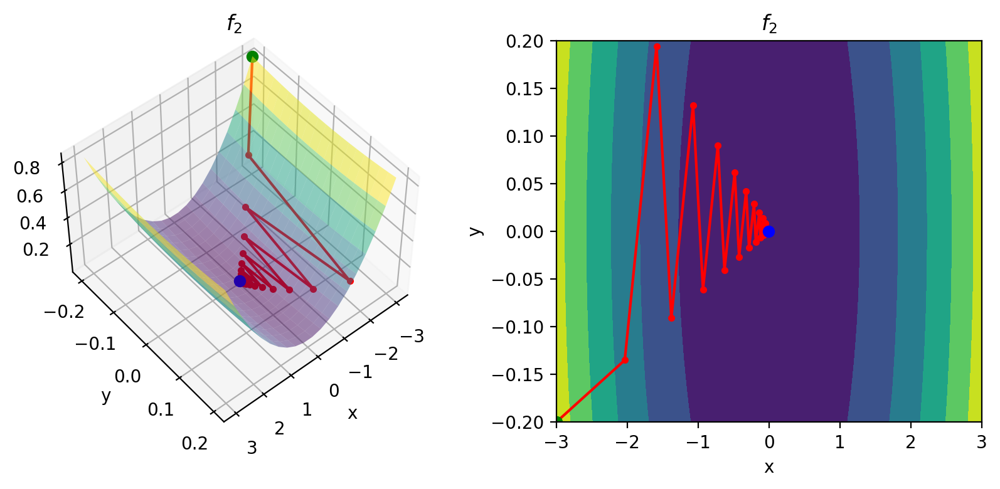

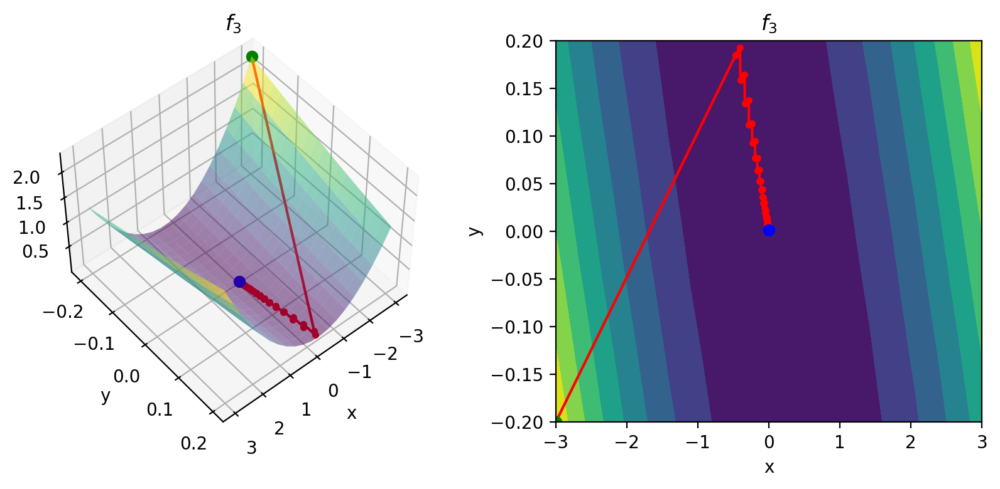

Функция|$x_1$|$x_2$|$x_3$
---|---|---|---
$f_1$|2|2|2
$f_2$|17|25|31
$f_3$|63|61|73


In [36]:
show_md(f"1. $x_0 = {x_1_str}$")
stat_f1 = draw_all_functions_with_start_golden(x_1, scale=(0.2, 3))
show_md(f"2. $x_0 = {x_2_str}$")
stat_f2 = draw_all_functions_with_start_golden(x_2, scale=(2.5, 2.5))
show_md(f"3. $x_0 = {x_3_str}$")
stat_f3 = draw_all_functions_with_start_golden(x_3, scale=(3, 0.2))

stat = pd.DataFrame(index=f_labels)
stat[x_1_label] = stat_f1
stat[x_2_label] = stat_f2
stat[x_3_label] = stat_f3

df_to_markdown(stat, "Функция")

Для функции $f_1$ количество итераций постоянно для выбранных точек. Для функций $f_1$ и $f_2$ количество итераций возрастает при удалении начальной точки от точки минимума $(0, 0)$ по оси
$x$, за исключением функции $f_3$ для точек $x_1$ и $x_2$, где количество итераций почти одинаковое. Можно сделать вывод, что количество итераций необходимых для сходимости зависит от начальной точки.

### Градиентный спуск с условием Вольфе

1. $x_0 = (-0.2\ {-3})$

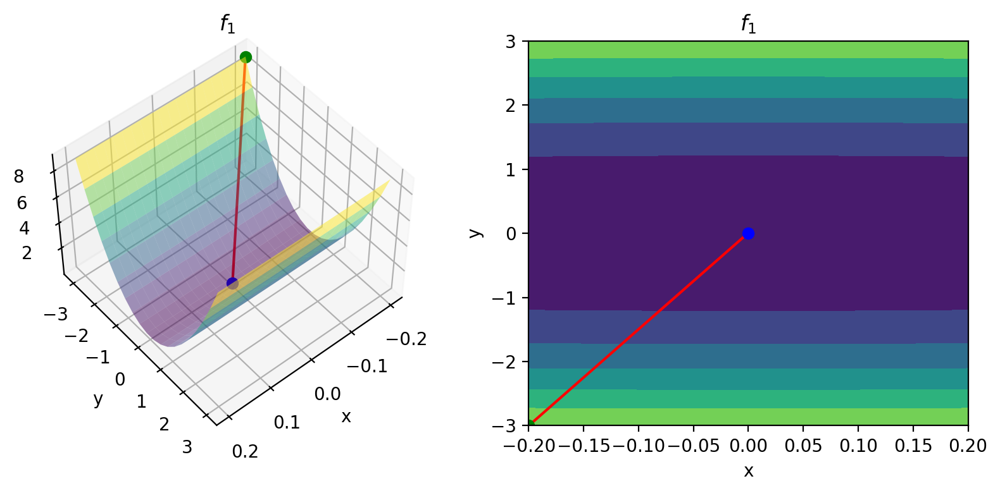

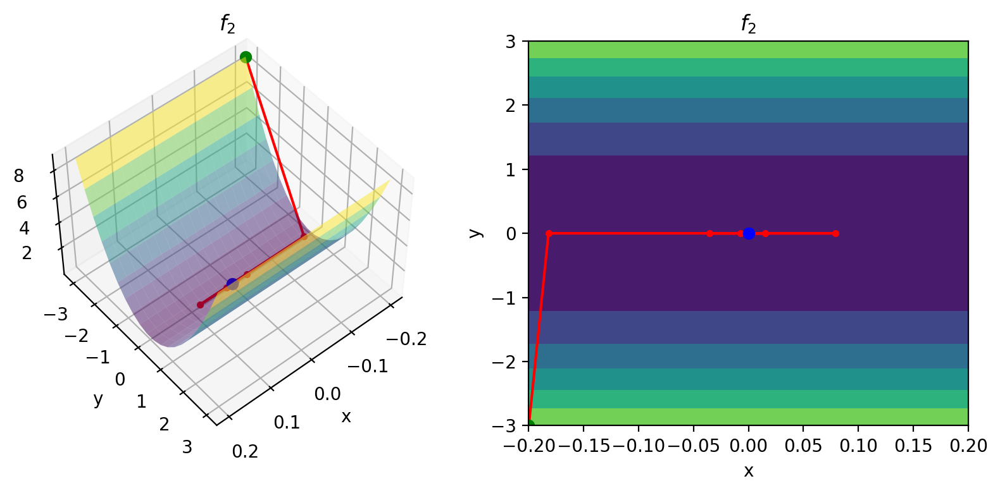

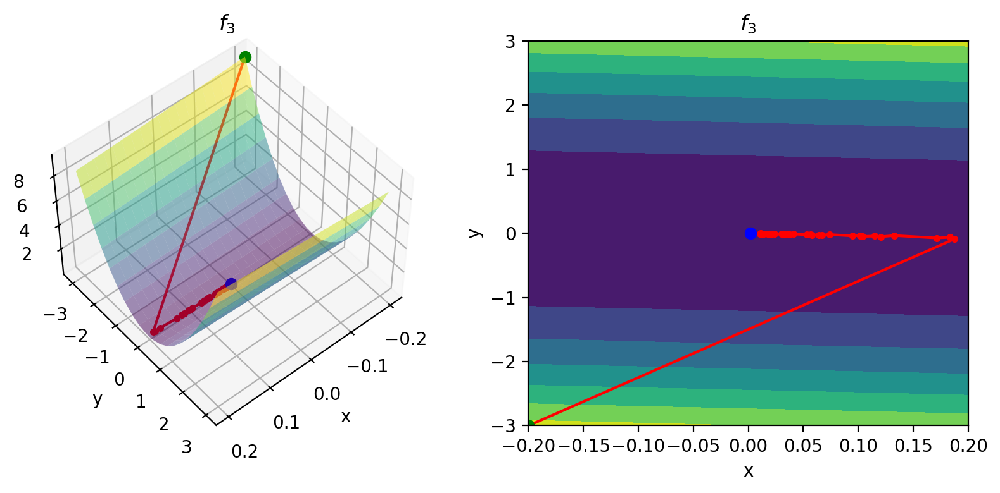

2. $x_0 = (-2.16\ {-2.16})$

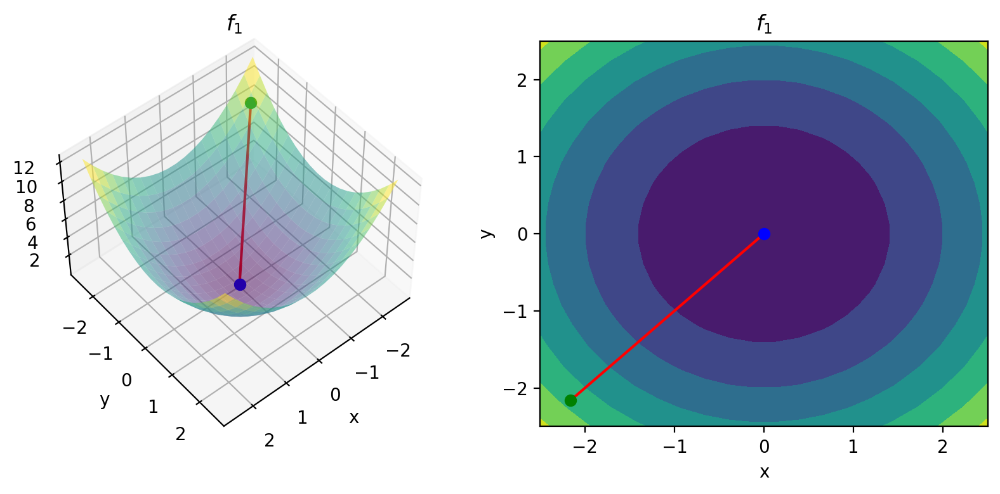

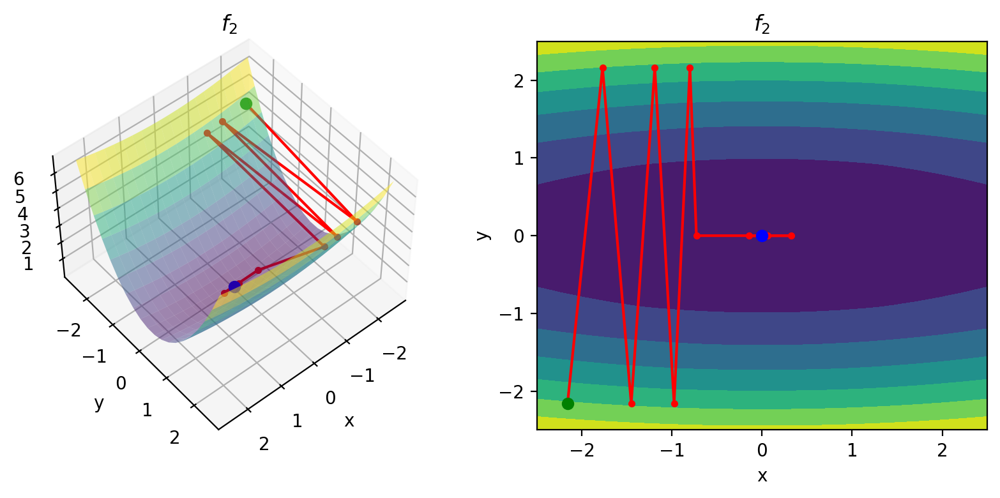

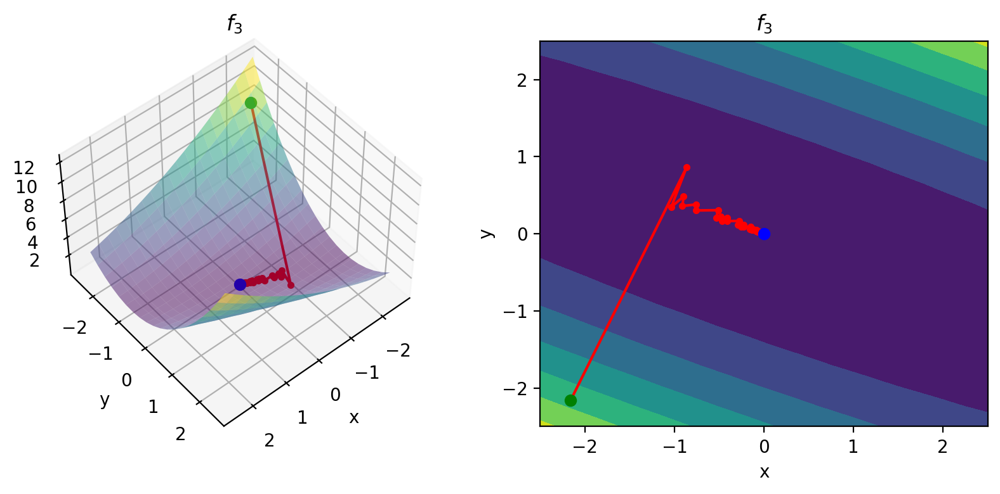

3. $x_0 = (-3\ {-0.2})$

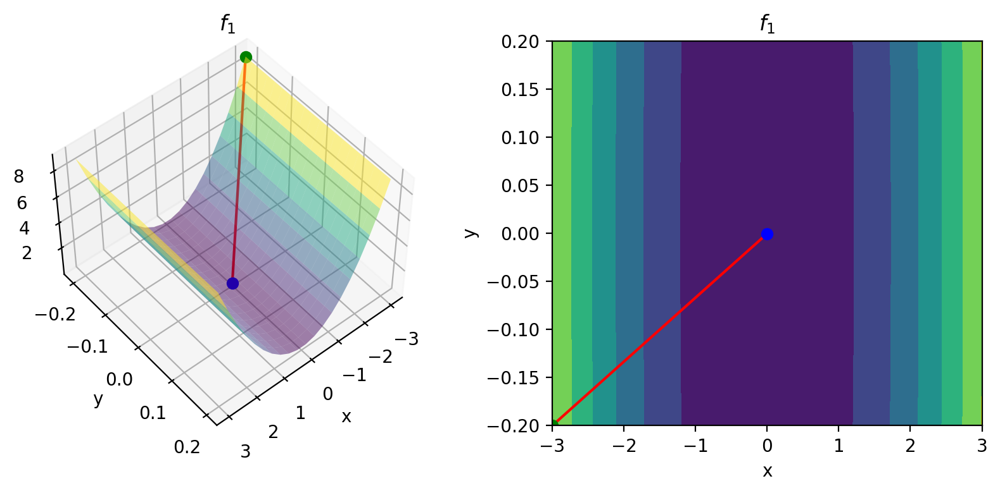

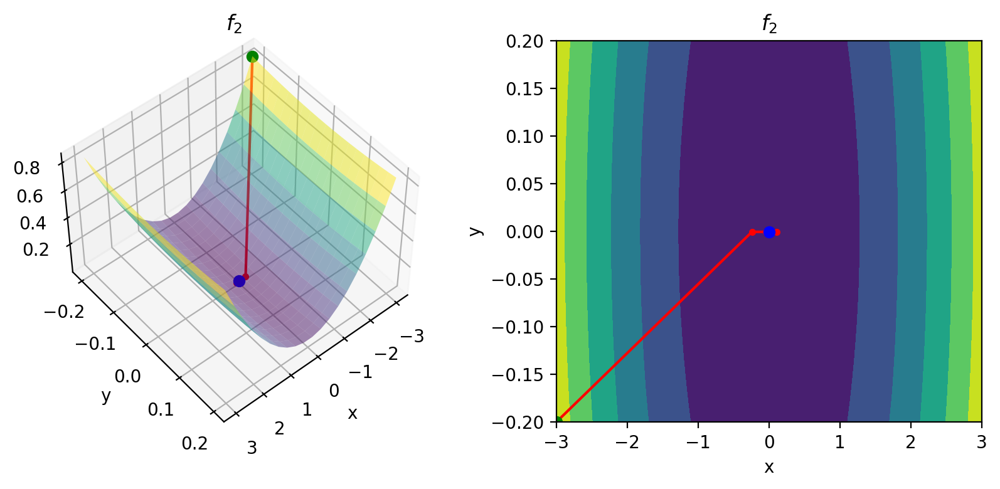

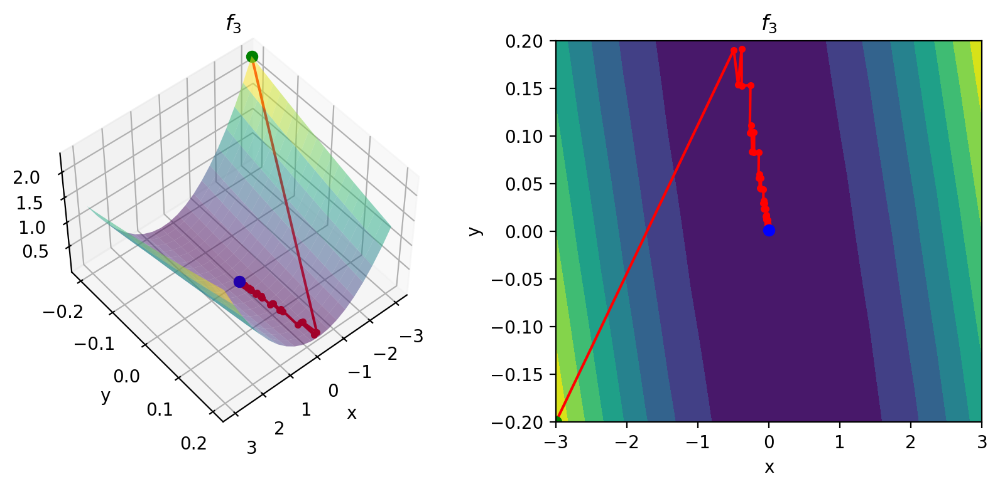

Функция|$x_1$|$x_2$|$x_3$
---|---|---|---
$f_1$|1|1|1
$f_2$|8|14|21
$f_3$|52|51|62


In [37]:
show_md(f"1. $x_0 = {x_1_str}$")
stat_f1 = draw_all_functions_with_start_wolfe(x_1, scale=(0.2, 3))
show_md(f"2. $x_0 = {x_2_str}$")
stat_f2 = draw_all_functions_with_start_wolfe(x_2, scale=(2.5, 2.5))
show_md(f"3. $x_0 = {x_3_str}$")
stat_f3 = draw_all_functions_with_start_wolfe(x_3, scale=(3, 0.2))

stat = pd.DataFrame(index=f_labels)
stat[x_1_label] = stat_f1
stat[x_2_label] = stat_f2
stat[x_3_label] = stat_f3

df_to_markdown(stat, "Функция")

Для функции $f_1$ количество итераций постоянно для выбранных точек. Для функций $f_1$ и $f_2$ количество итераций возрастает при удалении начальной точки от точки минимума $(0, 0)$ по оси
$x$, за исключением функции $f_3$ для точек $x_1$ и $x_2$, где количество итераций почти одинаковое. Можно сделать вывод, что количество итераций необходимых для сходимости зависит от начальной точки.

Таким образом, можно сделать вывод что для всех методов количество итераций необходимых для сходимости зависит от выбранной точки для плохо обусловленных функций, при чём количество итераций возрастает
с удалением от точки минимума по менее масштабируемой оси.

## Анализ влияния масштабирования осей плохо обусловленной функции

Рассмотрим влияние масштабирования на примере плохо обусловленных функций $f_2$ и $f_3$. Для этого вместо функции $f(x, y)$ будем рассматривать функцию $f(\beta x, \gamma y)$. 
Рассмотрим, работу методов для разных значений параметра $\beta = [1, 1.4, 2]$ и $\gamma = [1, 0.2, 0.1]$. Далее будем рассмотрена работа методов с масштабируемыми осями. В каждой таблице, значение параметров $\beta$ и $\gamma$ 
будет указано в первой строке.

In [38]:
def scale(f, scaling_rate_x, scaling_rate_y):
    return lambda x: f(np.array([x[0]* scaling_rate_x, x[1] * scaling_rate_y]))

def get_stat_internal(f, x_0, label, scaling_rate_x, scaling_rate_y, search):
    argmin, stat, _ = search.search_min(x_0, scale(f, scaling_rate_x, scaling_rate_y))
    # if label == f_2_label:
        # print(stat.toMap())
    return to_pd_stat(label, f, argmin, stat)

def get_stat(scaling_rate_x, scaling_rate_y, search):
    stat_f_2 = get_stat_internal(f_2, x_0, f_2_label, scaling_rate_x, scaling_rate_y, search)
    # print(stat_f_2)
    stat_f_3 = get_stat_internal(f_3, x_0, f_3_label, scaling_rate_x, scaling_rate_y, search)
    return pd.concat([stat_f_2, stat_f_3])[it_cnt]

def scaling_stat(rate_x, rate_y, search):
    from itertools import product
    stat = pd.DataFrame(index=[f_2_label, f_3_label])
    scaling_rates = product(rate_x, rate_y)
    for rate in scaling_rates:
        stat[f"{rate[0]}, {rate[1]}"] = get_stat(rate[0], rate[1], search)
    return stat

rate_x = [1, 1.4, 2]
rate_y = [1, 0.2, 0.1]

### Градиентный спуск с постоянным шагом

In [39]:

search = constant_step_search(0.3)
stat = scaling_stat(rate_x, rate_y, search)
df_to_markdown(stat, "Функция")

Функция|1, 1|1, 0.2|1, 0.1|1.4, 1|1.4, 0.2|1.4, 0.1|2, 1|2, 0.2|2, 0.1
---|---|---|---|---|---|---|---|---|---
$f_2$|112|133|297|62|131|297|32|131|297
$f_3$|246|565|57|155|428|29|101|261|13


Траектория на функции $f_2$ c $\beta = 2$ и $\gamma = 1$

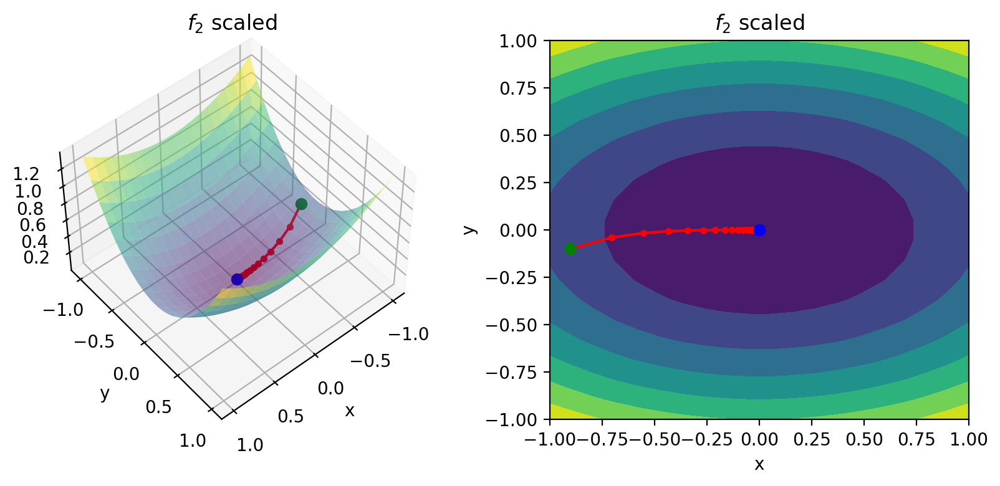

Траектория на функции $f_3$ c $\beta = 1.4$ и $\gamma = 0.1$

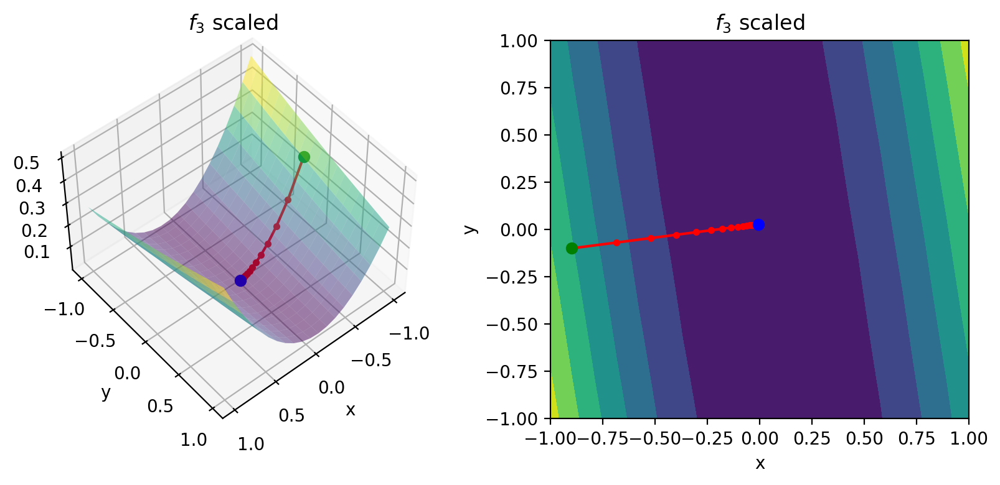

In [40]:
show_md(r"Траектория на функции $f_2$ c $\beta = 2$ и $\gamma = 1$")
draw_constant_step_search(f_2_label + " scaled", 0.3, scale(f_2, 2, 1), x_0)
plt.show()
show_md(r"Траектория на функции $f_3$ c $\beta = 1.4$ и $\gamma = 0.1$")
draw_constant_step_search(f_3_label + " scaled", 0.3, scale(f_3, 1.4, 0.1), x_0)
plt.show()

### Градиентный спуск с методом золотого сечения

In [41]:
search = golden_search(1)
stat = scaling_stat(rate_x, rate_y, search)
df_to_markdown(stat, "Функция")

Функция|1, 1|1, 0.2|1, 0.1|1.4, 1|1.4, 0.2|1.4, 0.1|2, 1|2, 0.2|2, 0.1
---|---|---|---|---|---|---|---|---|---
$f_2$|37|53|149|20|53|149|10|53|149
$f_3$|72|256|266|54|209|6|38|156|1


Траектория на функции $f_2$ c $\beta = 2$ и $\gamma = 1$

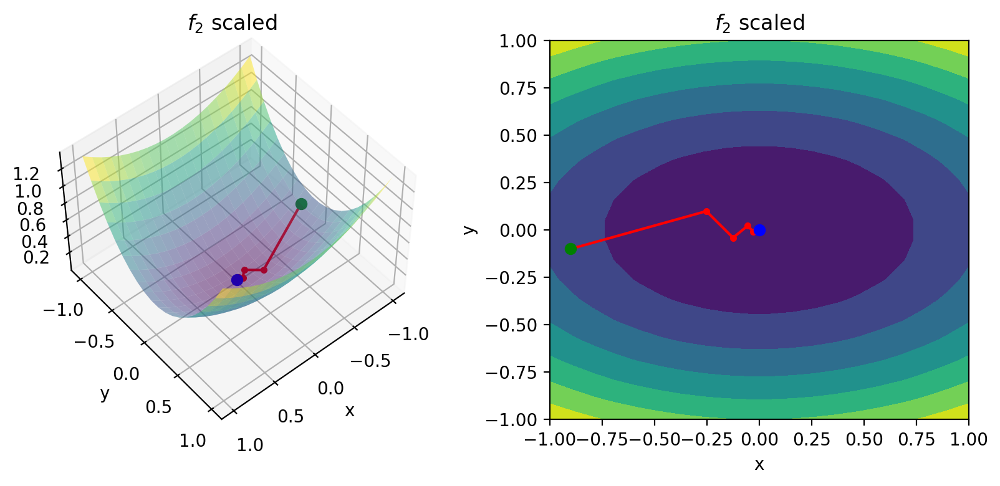

Траектория на функции $f_3$ c $\beta = 2$ и $\gamma = 0.1$

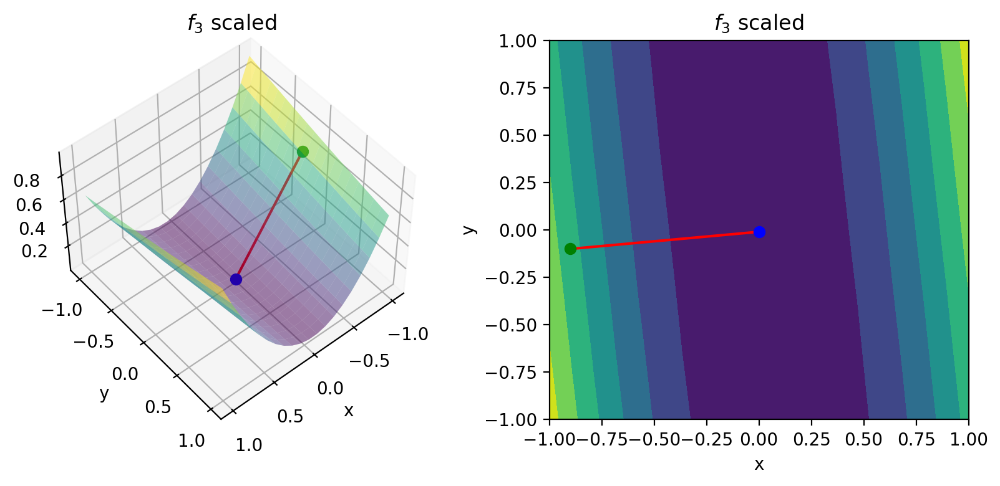

In [42]:
show_md(r"Траектория на функции $f_2$ c $\beta = 2$ и $\gamma = 1$")
draw_golden_search(f_2_label + " scaled", 1, scale(f_2, 2, 1), x_0)
plt.show()
show_md(r"Траектория на функции $f_3$ c $\beta = 2$ и $\gamma = 0.1$")
draw_golden_search(f_3_label + " scaled", 1, scale(f_3, 2, 0.1), x_0)
plt.show()

### Градиентный спуск с условием Вольфе

In [43]:
search = wolfe_search(0.001, 0.1)
stat = scaling_stat(rate_x, rate_y, search)
df_to_markdown(stat, "Функция")

Функция|1, 1|1, 0.2|1, 0.1|1.4, 1|1.4, 0.2|1.4, 0.1|2, 1|2, 0.2|2, 0.1
---|---|---|---|---|---|---|---|---|---
$f_2$|20|10|18|11|11|26|9|18|35
$f_3$|49|56|46|50|67|15|46|45|15


Траектория на функции $f_2$ c $\beta = 2$ и $\gamma = 1$

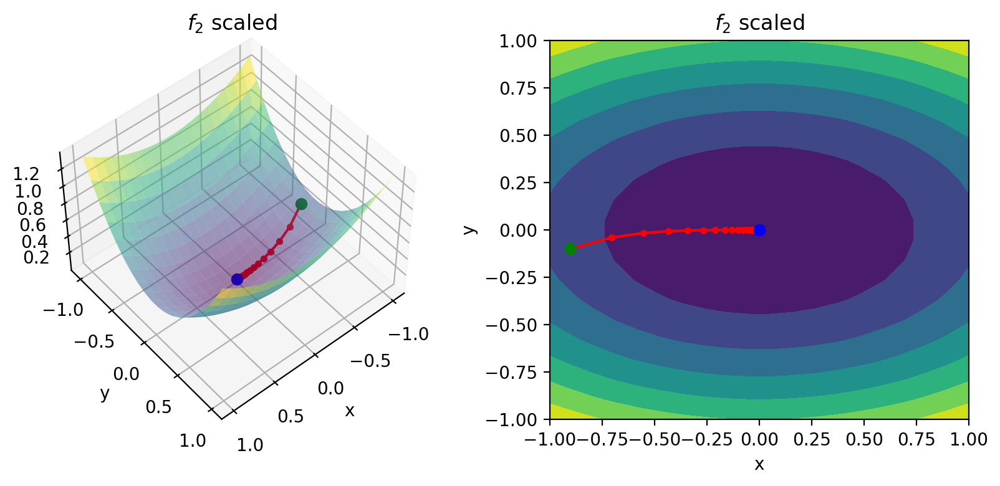

$Траектория на функции $f_3$ c $\beta = 1.4$ и $\gamma = 0.1$

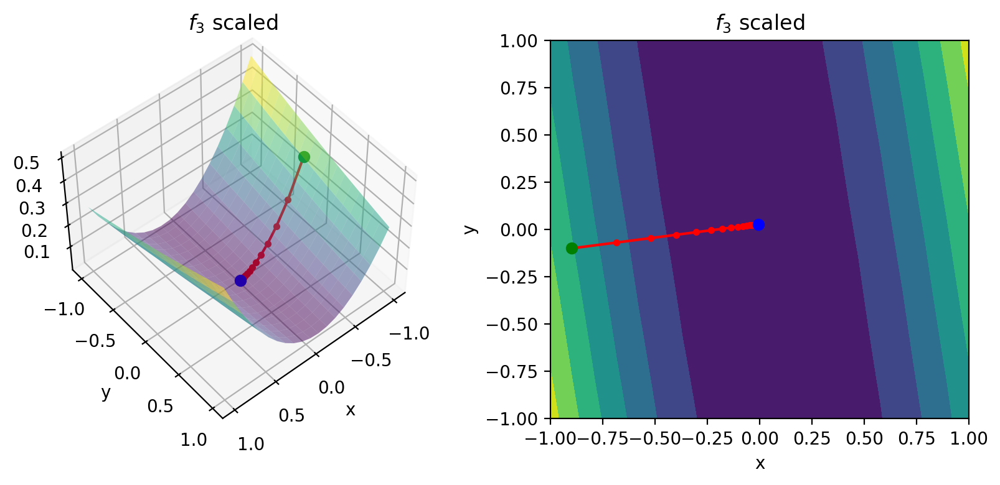

In [44]:
show_md(r"Траектория на функции $f_2$ c $\beta = 2$ и $\gamma = 1$")
draw_constant_step_search(f_2_label + " scaled", 0.3, scale(f_2, 2, 1), x_0)
plt.show()
show_md(r"$Траектория на функции $f_3$ c $\beta = 1.4$ и $\gamma = 0.1$")
draw_constant_step_search(f_3_label + " scaled", 0.3, scale(f_3, 1.4, 0.1), x_0)
plt.show()

На основе полученных данных, можно сделать вывод что масштабирование осей, может существенно снизить количество итераций необходимых для сходимости любого из представленных методов. Также, траектори яградиентного спуска перестает быть зигзагообразной и становится равномерной при масштабировании осей.

# Исследование сходимости в зависимости от числа обусловленности функции и размерности пространства

Пусть $T(n, k)$ - количество итераций необходимых градиентному спуску для сходимости, где $n$ - размерность пространства, $k$ - число обусловленности. Исследуем зависимость $T(n, k)$ от $n$ и $k$ для представленных методов,
построив соответствующие графики. Для этого необходимо генерировать функцию с заданной размерность и числом обусловленности. Добиться этого можно сгенерировав cлучайный вектор $b$ и случайную диагональную матрицу $A$, где наибольшее значение на диагонали равно 1, а наименьшее $\frac{1}{k}$. Функция $f(x) = A x^T - b x^T$ будет иметь число облусленности $k$, как отношение наибольшего сингулярного числа к наименьшего матрицы $A$.

In [45]:
np.random.seed(42)
d = 100
ns = [n for n in range(2, 200, 20)]
ks = [k for k in range(2, 1000, d)]
reset = 3
MAX_IT = 10000

def run_ones(n, k, search_provider):
    search = search_provider()
    f = generate_quadratic(n, k)
    x = np.random.rand(n)
    _, stat, _ = search.search_min(x, f)
    return stat.get(Statistics.STEPS)


def points_for_n(k, search_provider):
    points = []
    for n in ns:
        it_sum = sum([run_ones(n, k, search_provider) for _ in range(reset)])
        points.append(it_sum / reset)
    return points

def points_for_k(n, search_provider):
    points = []
    for k in ks:
        it_sum = sum([run_ones(n, k, search_provider) for _ in range(reset)])
        points.append(it_sum / reset)
    return points

### Зависимость $T(n, k)$ от $k$

Построим график зависимости $T(n, k)$ от $k$ для значений $k$ от 2 до 1000 c шагом 100 и $n$ равным 2, 10, 50 для всех методов.

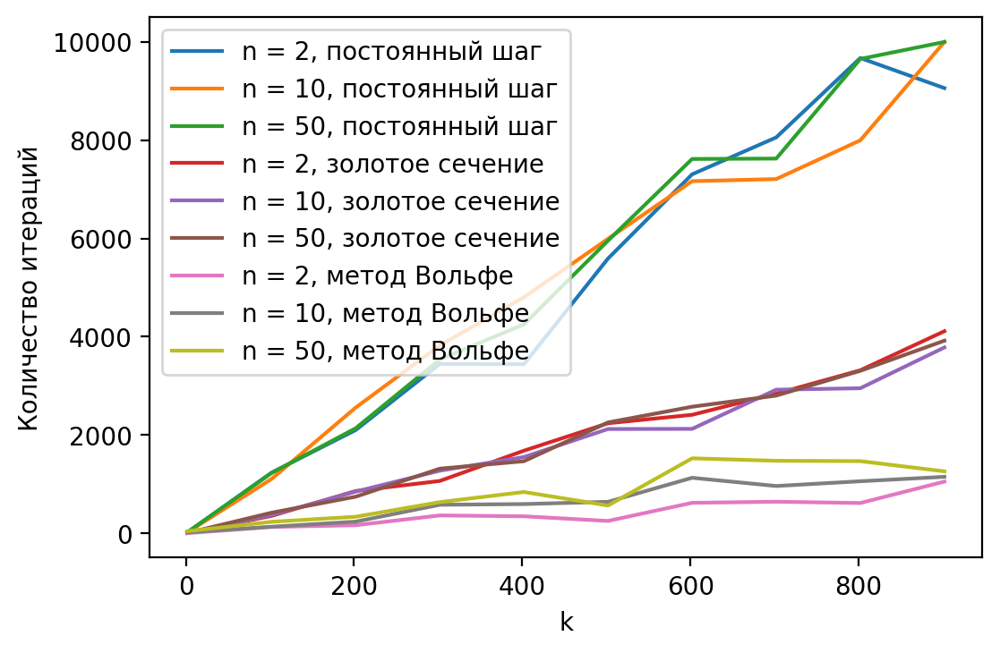

In [46]:
p2_const_k = points_for_k(2, lambda: constant_step_search(0.3, MAX_IT))
p10_const_k = points_for_k(10, lambda: constant_step_search(0.3, MAX_IT))
p50_const_k = points_for_k(50, lambda: constant_step_search(0.3, MAX_IT))
p2_golden_k = points_for_k(2, lambda:   golden_search(1, MAX_IT))
p10_golden_k = points_for_k(10, lambda: golden_search(1, MAX_IT))
p50_golden_k = points_for_k(50, lambda: golden_search(1, MAX_IT))
p2_wolfe_k = points_for_k(2, lambda:   wolfe_search(0.001, 0.1, MAX_IT))
p10_wolfe_k = points_for_k(10, lambda: wolfe_search(0.001, 0.1, MAX_IT))
p50_wolfe_k = points_for_k(50, lambda: wolfe_search(0.001, 0.1, MAX_IT))
fig = plt.figure(dpi=200)
ax = fig.add_subplot()
ax.plot(ks, p2_const_k,   label="n = 2, постоянный шаг")
ax.plot(ks, p10_const_k, label="n = 10, постоянный шаг")
ax.plot(ks, p50_const_k, label="n = 50, постоянный шаг")
ax.plot(ks, p2_golden_k,   label="n = 2, золотое сечение")
ax.plot(ks, p10_golden_k, label="n = 10, золотое сечение")
ax.plot(ks, p50_golden_k, label="n = 50, золотое сечение")
ax.plot(ks, p2_wolfe_k,   label="n = 2, метод Вольфе")
ax.plot(ks, p10_wolfe_k, label="n = 10, метод Вольфе")
ax.plot(ks, p50_wolfe_k, label="n = 50, метод Вольфе")
plt.xlabel("k")
plt.ylabel("Количество итераций")
plt.legend()
plt.show()

На основе полученных данных, можно сделать вывод, что количество итераций необходимых для сходимости линейно зависит от числа обусловленности, для всех методов. Также, градиентный спуск с методом Вольфе требует наименьшее количество итераций для сходимости, а градиентный спуск с постоянным шагом наибольшее.

### Зависимость $T(n, k)$ от $n$

Построим график зависимости $T(n, k)$ от $n$ для значений $n$ от 2 до 100 с шагом 20 и $k$ равным 2, 10, 50 для всех методов.

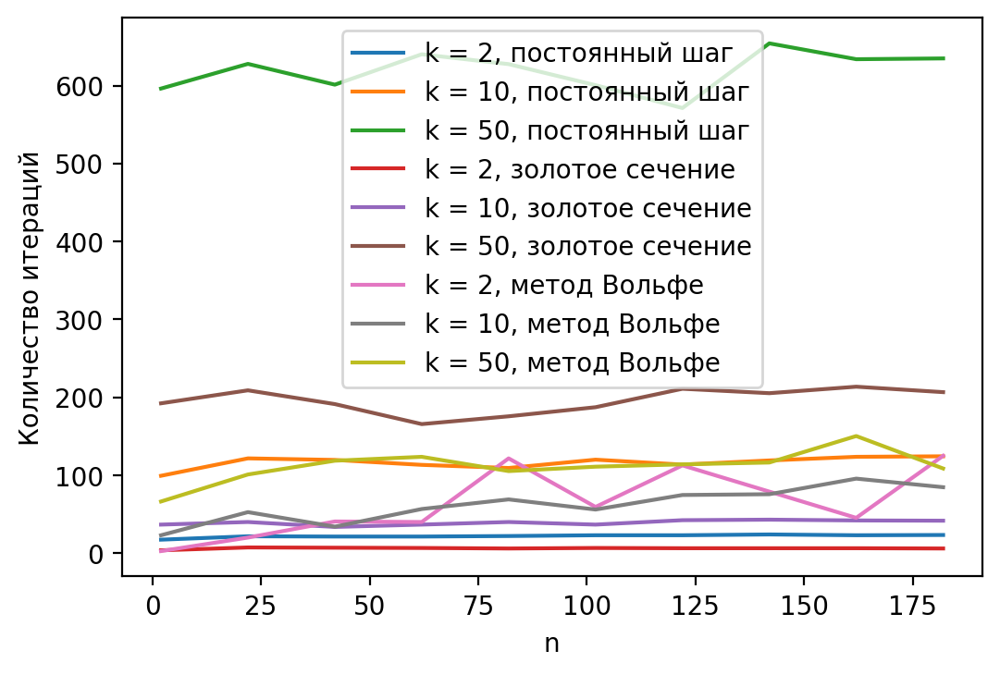

In [47]:
p2_const_n = points_for_n(2, lambda: constant_step_search(0.3, MAX_IT))
p10_const_n = points_for_n(10, lambda: constant_step_search(0.3, MAX_IT))
p50_const_n = points_for_n(50, lambda: constant_step_search(0.3, MAX_IT))
p2_golden_n = points_for_n(2, lambda:   golden_search(1, MAX_IT))
p10_golden_n = points_for_n(10, lambda: golden_search(1, MAX_IT))
p50_golden_n = points_for_n(50, lambda: golden_search(1, MAX_IT))
p2_wolfe_n = points_for_n(2, lambda:   wolfe_search(0.001, 0.1, MAX_IT))
p10_wolfe_n = points_for_n(10, lambda: wolfe_search(0.001, 0.1, MAX_IT))
p50_wolfe_n = points_for_n(50, lambda: wolfe_search(0.001, 0.1, MAX_IT))
fig = plt.figure(dpi=200)
ax = fig.add_subplot()
ax.plot(ns, p2_const_n,   label="k = 2, постоянный шаг")
ax.plot(ns, p10_const_n, label="k = 10, постоянный шаг")
ax.plot(ns, p50_const_n, label="k = 50, постоянный шаг")
ax.plot(ns, p2_golden_n,   label="k = 2, золотое сечение")
ax.plot(ns, p10_golden_n, label="k = 10, золотое сечение")
ax.plot(ns, p50_golden_n, label="k = 50, золотое сечение")
ax.plot(ns, p2_wolfe_n,   label="k = 2, метод Вольфе")
ax.plot(ns, p10_wolfe_n, label="k = 10, метод Вольфе")
ax.plot(ns, p50_wolfe_n, label="k = 50, метод Вольфе")
plt.xlabel("n")
plt.ylabel("Количество итераций")
plt.legend()
plt.show()

На основе полученных данных, можно сделать вывод, что количество итераций необходимых для сходимости не зависит от размерности функции, для всех методов.

# Выводы

В ходе работы была проанализирована работа методов градиентного спуска с постоянным шагом, с использованием метода золотого сечения и с условием Вольфе.

Сформулируем общие выводы:

1. Сходимость градиентного спуска с постоянным шагом зависит от выбора шага
2. Для улучшения сходимости могут быть применены модификации градиентного спуска: подбор шага методом золотого сечения или подбор шага удовлетворяющему условию Вольфе.
При этом могут потребоваться дополнительные вычисления значений функции и градиента функции. 
3. Градиентный спуск с условием Вольфе является наиболее оптимальным методом среди рассмотренных, с точки зрения количества итераций для сходимости.
3. Количество итераций необходимых для сходимости линейно растет с увеличением числа обусловленности функции.
4. С помощью масштабирования осей плохо обусловленной функции можно снизить количество итераций необходимых для сходимости.
5. Скорость сходимости зависит от выбора начальной точки.
5. Количество итераций необходимых для сходимости не зависит от размерности функции.